In [21]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.2/288.2 kB 1.7 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip available: 22.2.2 -> 22.3
[notice] To update, run: pip install --upgrade pip


In [143]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import scipy
import time
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.model_selection import validation_curve,learning_curve
from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score, precision_score, recall_score, classification_report, mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.neural_network import MLPClassifier
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, adjusted_mutual_info_score, silhouette_samples, mean_squared_error
from sklearn.metrics import homogeneity_score
import seaborn as sns
from sklearn.decomposition import PCA, FastICA
from sklearn.random_projection import GaussianRandomProjection
from scipy.linalg import pinv
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel
from mpl_toolkits import mplot3d
from sklearn.metrics import *
plt.style.use('seaborn-poster')

# Import Data

In [144]:
# Breast Cancer data 
cancer_df = pd.read_csv('./data/breast-cancer-wisconsin_data.csv')

# Wine quality data
wine_df = pd.read_csv('./data/winequality-white.csv', sep=';')

print("---------------------------- Breast Cancer Data ---------------------------------------")
print(cancer_df.head())

print("---------------------------- Wine Quality Data -----------------------------------------")
print(wine_df.head())

---------------------------- Breast Cancer Data ---------------------------------------
   Sample code number  Clump Thickness  Uniformity of Cell Size  \
0             1000025                5                        1   
1             1002945                5                        4   
2             1015425                3                        1   
3             1016277                6                        8   
4             1017023                4                        1   

   Uniformity of Cell Shape  Marginal Adhesion  Single Epithelial Cell Size  \
0                         1                  1                            2   
1                         4                  5                            7   
2                         1                  1                            2   
3                         8                  1                            3   
4                         1                  3                            2   

  Bare Nuclei  Bland Chromatin  No

In [5]:
print("---------------------------- Breast Cancer Data ---------------------------------------")
print(cancer_df['Class'].value_counts(normalize=True))

print("---------------------------- Wine Quality Data -----------------------------------------")
print(wine_df['quality'].value_counts(normalize=True))

---------------------------- Breast Cancer Data ---------------------------------------
2    0.655222
4    0.344778
Name: Class, dtype: float64
---------------------------- Wine Quality Data -----------------------------------------
6    0.448755
5    0.297468
7    0.179665
8    0.035729
4    0.033279
3    0.004083
9    0.001021
Name: quality, dtype: float64


In [145]:
# Data Pre-Processing

scaler = StandardScaler()

def process_cancer(df):
    #df['Class'].map({4: 1, 2: 0})
    df['Class'] = np.where(df['Class'] == 2, 0, 1)
    df.drop('Sample code number', axis = 1, inplace = True)
    # Dropping records with missing values of Bare Nuclei and converting it to numeric
    df = df[df['Bare Nuclei'] != '?']
    df['Bare Nuclei'] = pd.to_numeric(df['Bare Nuclei'])
    X = df.drop('Class', axis = 1)
    y = df.Class.values
    # Features scaling
    scaler.fit(X)
    X = scaler.transform(X)
    return X,y

def process_wine(df):
    df['quality'] = np.where(df['quality'] >= 6, 1, 0)
    X = df.drop('quality', axis = 1)
    y = df.quality.values
    scaler.fit(X)
    X = scaler.transform(X)
    return X,y

# cancer_X, cancer_y = process_cancer(cancer_df)
# wine_X, wine_y = process_wine(wine_df)

#X, y = process_cancer(cancer_df)   # Breast Cancer data
X, y = process_wine(wine_df)   # Wine Quality data

In [146]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 5)

# Part 1: Clustering

# KMeans

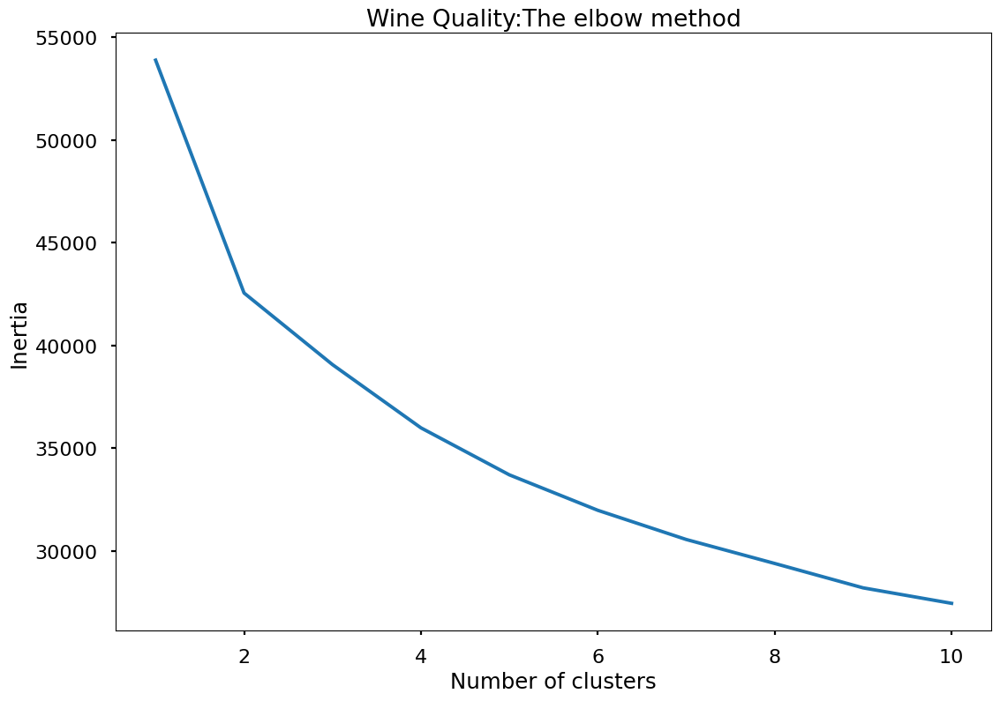

In [110]:
# The major difference between elbow and silhouette scores is that elbow only calculates the euclidean distance
# whereas silhouette takes into account variables such as variance, skewness, high-low differences, etc.

# Elbow method 

wcss=[]

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, random_state = 0)
    kmeans.fit_predict(X)
    wcss.append(kmeans.inertia_)

#Plotting the results onto a line graph, allowing us to observe 'The elbow'
plt.plot(range(1, 11), wcss)
plt.title('Wine Quality:The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia') #within cluster sum of squares
plt.savefig('./plots/WQ_P1_KM_elbow.png')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.21442808761278218
For n_clusters = 3 The average silhouette_score is : 0.1442590155604812
For n_clusters = 4 The average silhouette_score is : 0.1589731562936731
For n_clusters = 5 The average silhouette_score is : 0.14378826525989757
For n_clusters = 6 The average silhouette_score is : 0.1479002783779736
For n_clusters = 7 The average silhouette_score is : 0.1257797091651907
For n_clusters = 8 The average silhouette_score is : 0.1285777821575091
For n_clusters = 9 The average silhouette_score is : 0.1283877857317703
For n_clusters = 10 The average silhouette_score is : 0.11847922880782837


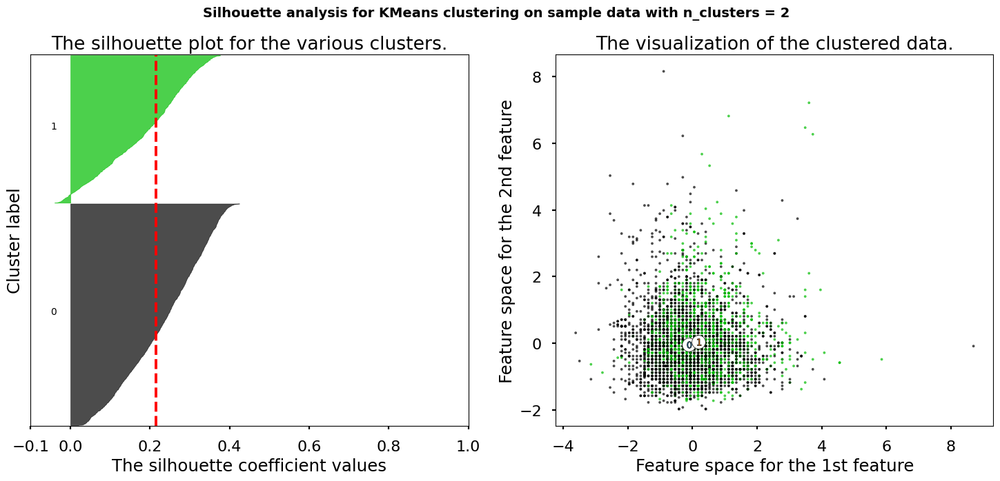

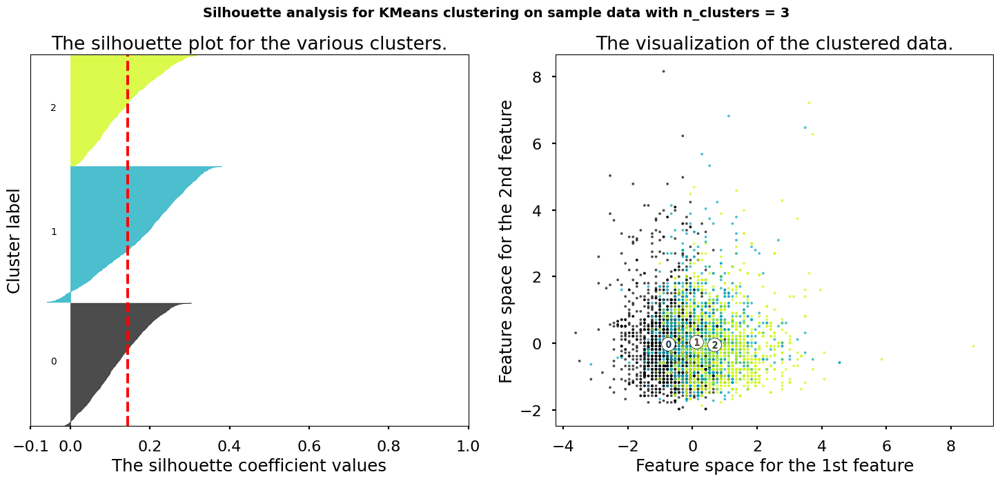

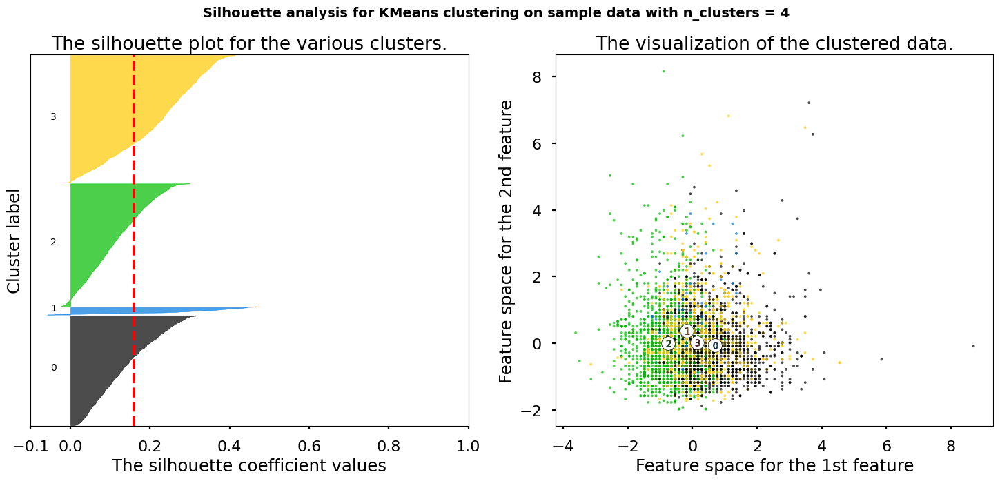

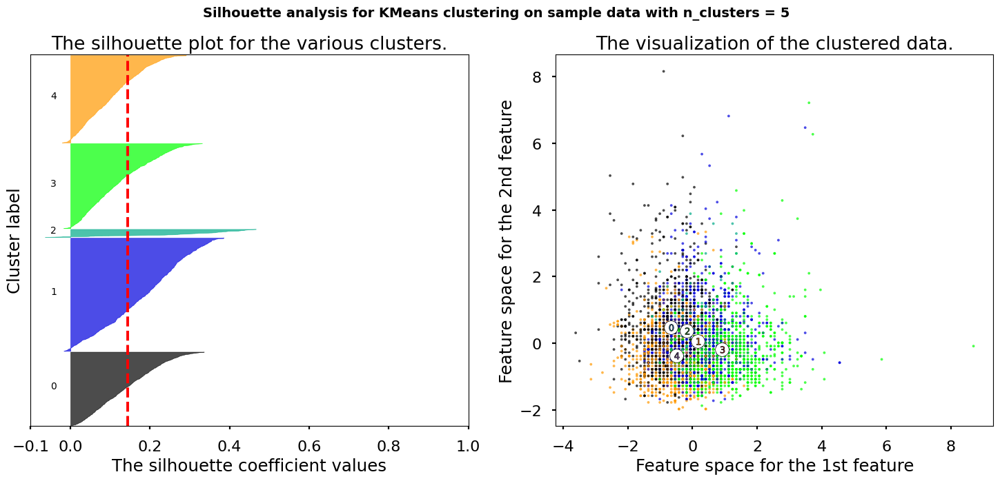

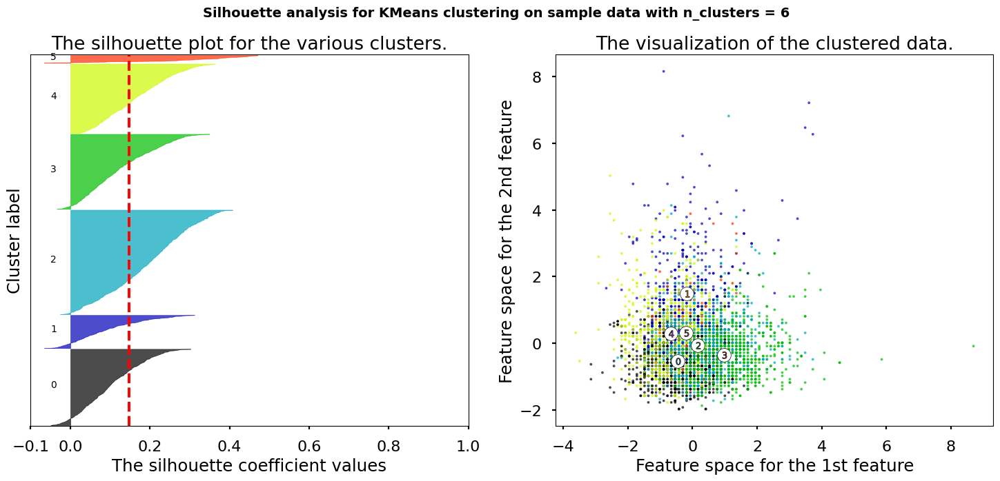

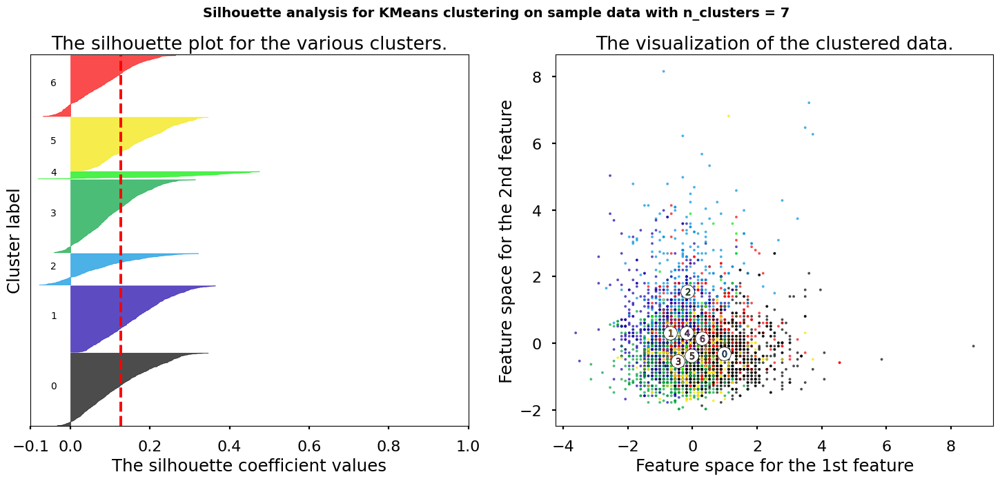

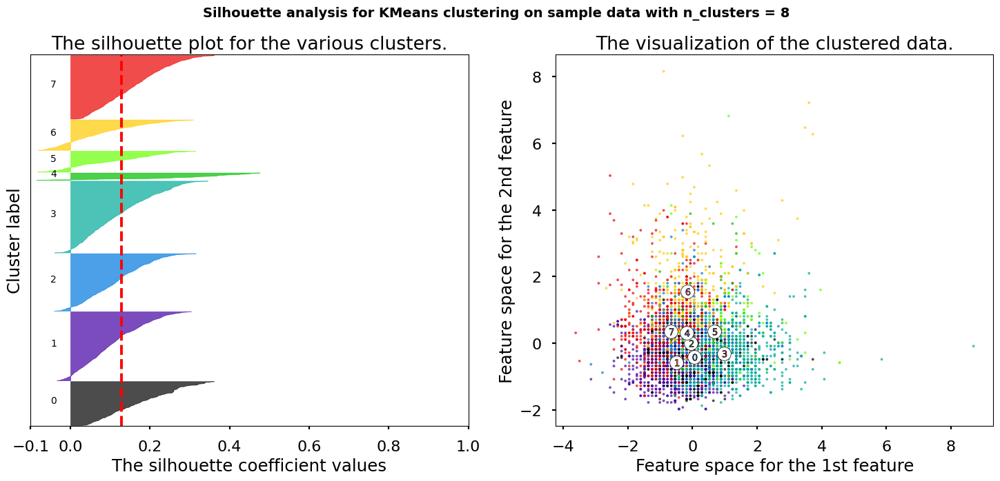

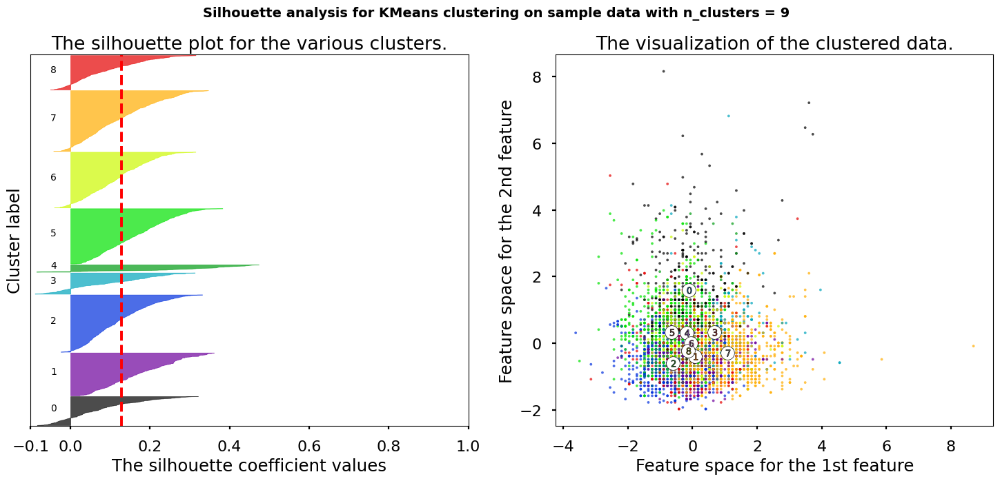

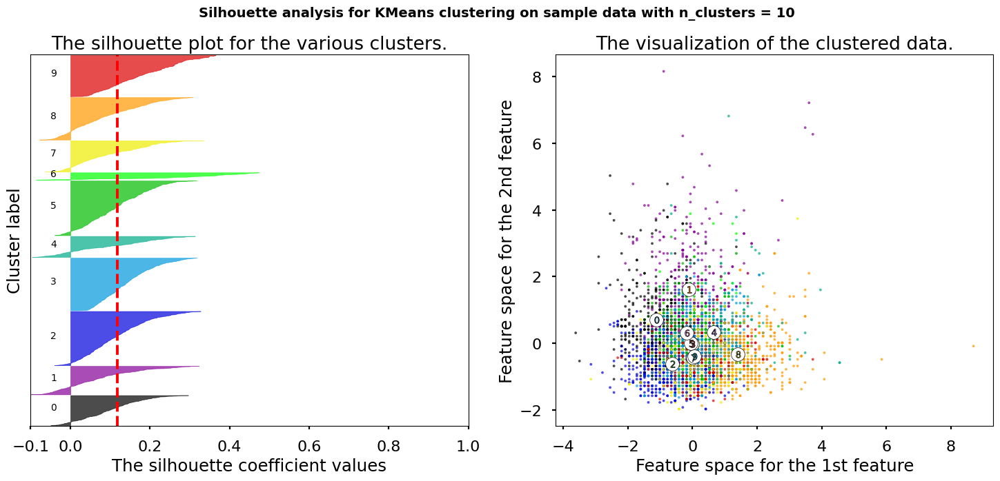

In [112]:
# silhouette score Reference: https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

range_n_clusters = np.arange(2,11,1)
sil = []
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    sil.append(silhouette_avg)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

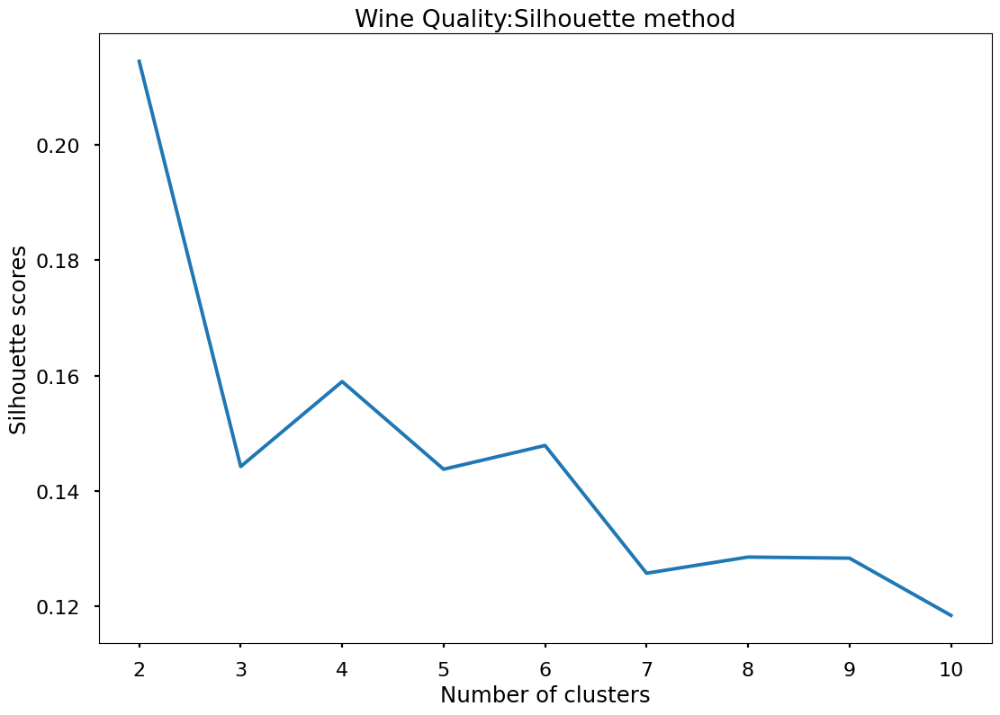

[0.21442808761278218,
 0.1442590155604812,
 0.1589731562936731,
 0.14378826525989757,
 0.1479002783779736,
 0.1257797091651907,
 0.1285777821575091,
 0.1283877857317703,
 0.11847922880782837]

In [113]:
plt.plot(range(2, 11), sil)
plt.title('Wine Quality:Silhouette method')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette scores') 
plt.savefig('./plots/WQ_P1_KM_sil.png')
plt.show()
sil

# Validating the clustering algorithm

In [120]:
homogeneity_score(KMeans(n_clusters=2, random_state=10).fit_predict(X), y)

0.03809468621562412

In [121]:
adjusted_mutual_info_score(KMeans(n_clusters=2, random_state=10).fit_predict(X), y)

0.038972964415900736

In [124]:
print(fowlkes_mallows_score(KMeans(n_clusters=2, random_state=10).fit_predict(X), y))
print(completeness_score(KMeans(n_clusters=2, random_state=10).fit_predict(X), y))
print(v_measure_score(KMeans(n_clusters=2, random_state=10).fit_predict(X), y))

0.5704217007669461
0.040207832002300284
0.039122745433940155


In [15]:
wine_df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

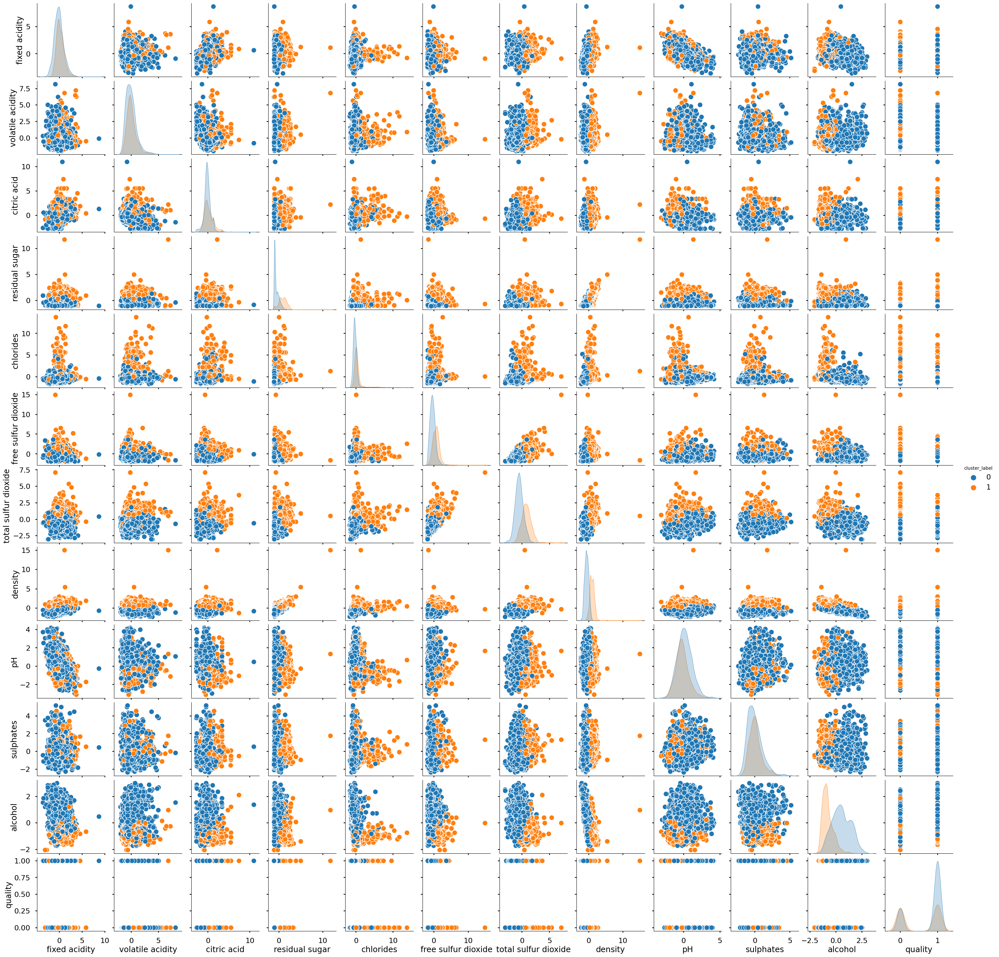

In [169]:
df = pd.DataFrame(X, columns=['fixed acidity','volatile acidity','citric acid','residual sugar','chlorides',
                             'free sulfur dioxide','total sulfur dioxide','density','pH','sulphates','alcohol'])
df['quality'] = y
df['cluster_label'] = KMeans(n_clusters=2, random_state=10).fit_predict(X)
#sns.pairplot(df[['Class','cluster_label']])
#sns.pairplot(df, hue='Class')
sns.pairplot(df, hue='cluster_label')

In [171]:
print(df.groupby(['cluster_label','quality']).count())

                       fixed acidity  volatile acidity  citric acid  \
cluster_label quality                                                 
0             0                  727               727          727   
              1                 2213              2213         2213   
1             0                  913               913          913   
              1                 1045              1045         1045   

                       residual sugar  chlorides  free sulfur dioxide  \
cluster_label quality                                                   
0             0                   727        727                  727   
              1                  2213       2213                 2213   
1             0                   913        913                  913   
              1                  1045       1045                 1045   

                       total sulfur dioxide  density    pH  sulphates  alcohol  
cluster_label quality                                

/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


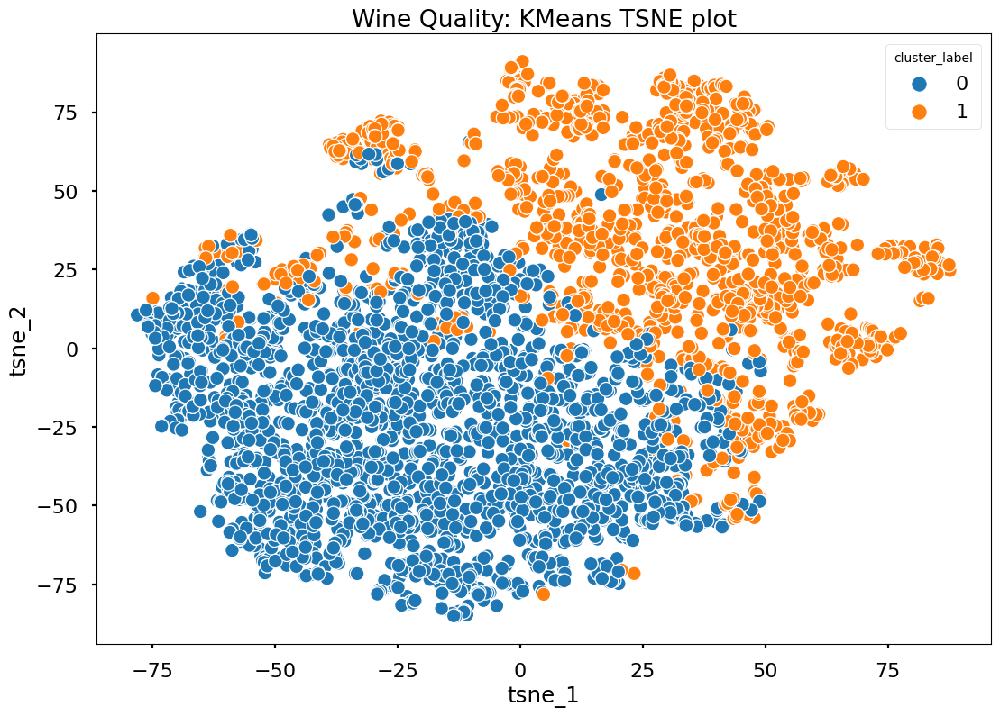

In [118]:
# Reference: https://danielmuellerkomorowska.com/2021/01/05/introduction-to-t-sne-in-python-with-scikit-learn/
from sklearn.manifold import TSNE
tsne_result = TSNE(2).fit_transform(X)
tsne_result_df = pd.DataFrame({'tsne_1': tsne_result[:,0], 'tsne_2': tsne_result[:,1], 
                               'cluster_label': KMeans(n_clusters=2, random_state=10).fit_predict(X)})
fig, ax = plt.subplots(1)
sns.scatterplot(x='tsne_1', y='tsne_2', hue='cluster_label', data=tsne_result_df, ax=ax)
plt.title('Wine Quality: KMeans TSNE plot')
plt.savefig('./plots/WQ_KM_TSNE.png')



# EM

For n_clusters = 2 The average silhouette_score is : 0.24864755633481744
For n_clusters = 3 The average silhouette_score is : 0.08234284210809005
For n_clusters = 4 The average silhouette_score is : 0.05596753209554314
For n_clusters = 5 The average silhouette_score is : 0.0359636888791836
For n_clusters = 6 The average silhouette_score is : 0.029500554212917456
For n_clusters = 7 The average silhouette_score is : 0.027979860687438626
For n_clusters = 8 The average silhouette_score is : 0.0215930355791905
For n_clusters = 9 The average silhouette_score is : 0.028317067666332314
For n_clusters = 10 The average silhouette_score is : 0.014069652340471982


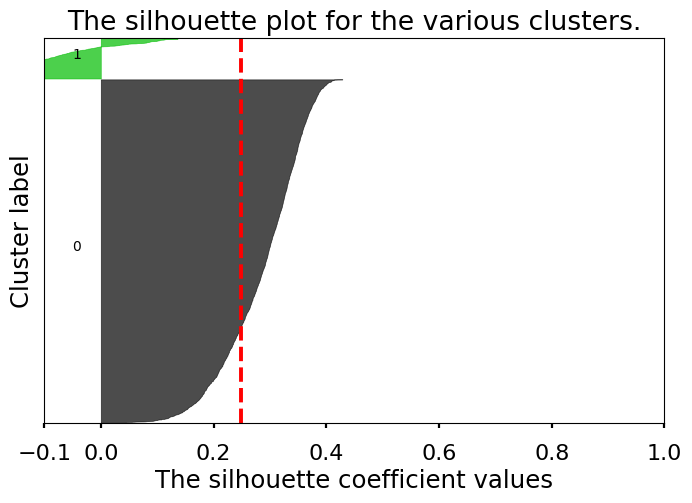

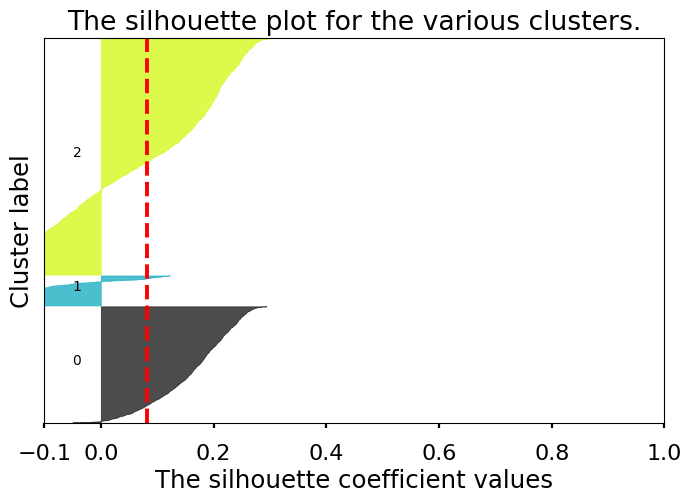

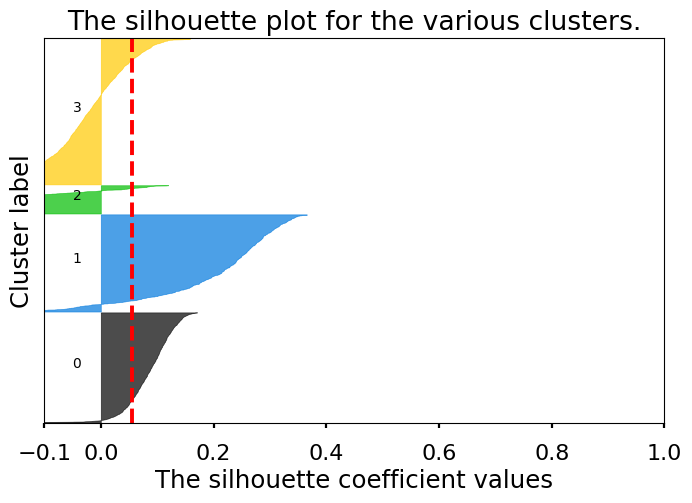

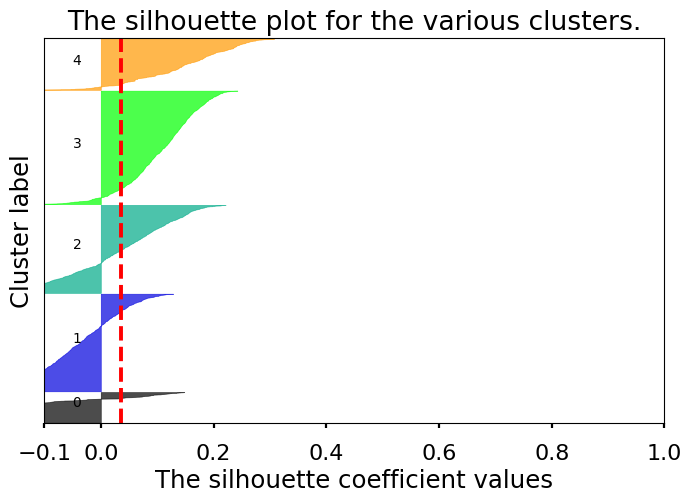

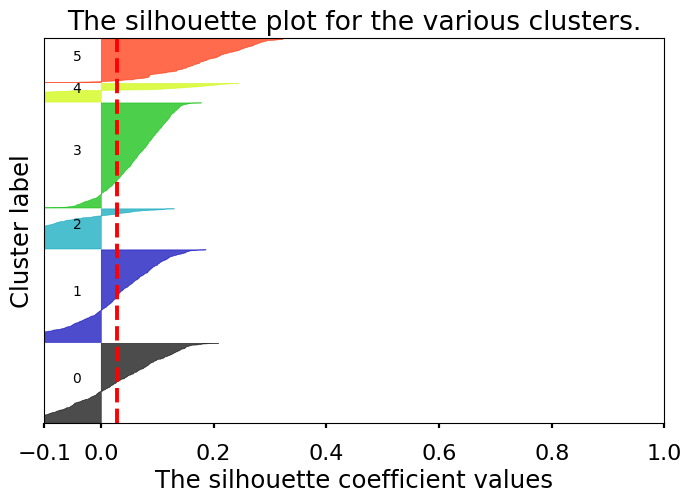

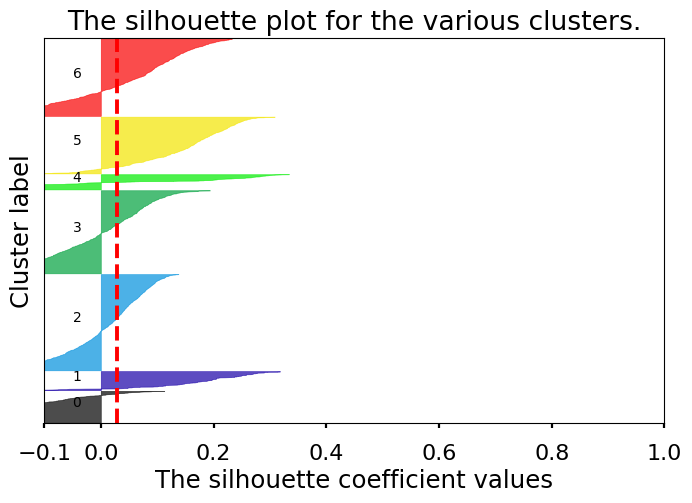

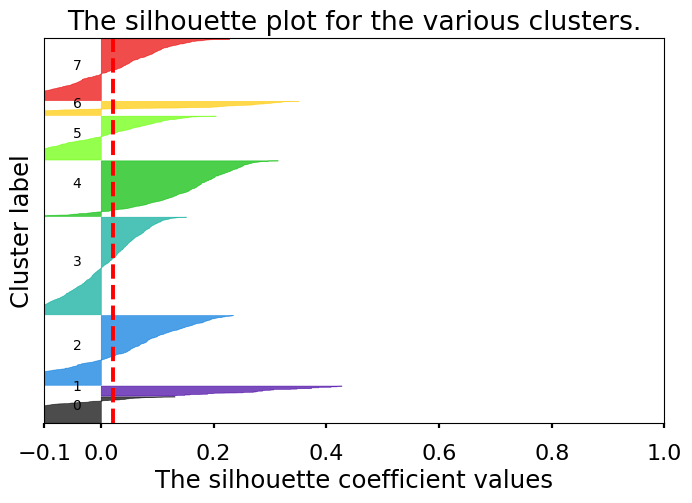

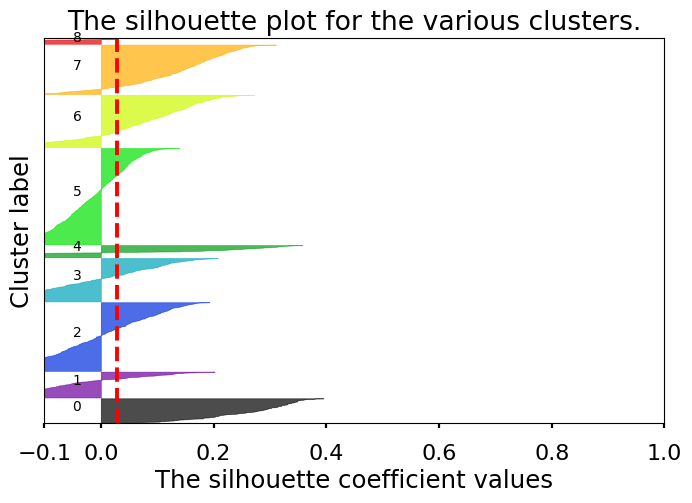

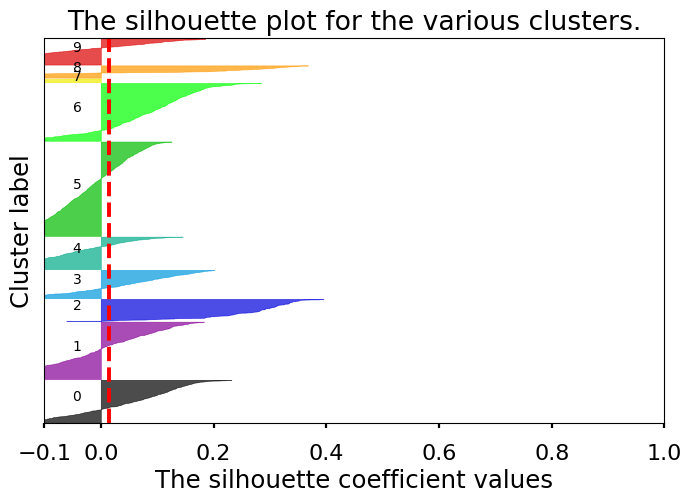

In [114]:
# silhouette score Reference: https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

range_n_clusters = np.arange(2,11,1)
sil = []
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 1 columns
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(8, 5)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = GaussianMixture(n_components=n_clusters, covariance_type='full')
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    sil.append(silhouette_avg)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

#     # 2nd Plot showing the actual clusters formed
#     colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
#     ax2.scatter(
#         X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
#     )

#     # Labeling the clusters
#     centers = clusterer.cluster_centers_
#     # Draw white circles at cluster centers
#     ax2.scatter(
#         centers[:, 0],
#         centers[:, 1],
#         marker="o",
#         c="white",
#         alpha=1,
#         s=200,
#         edgecolor="k",
#     )

#     for i, c in enumerate(centers):
#         ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

#     ax2.set_title("The visualization of the clustered data.")
#     ax2.set_xlabel("Feature space for the 1st feature")
#     ax2.set_ylabel("Feature space for the 2nd feature")

#     plt.suptitle(
#         "Silhouette analysis for Gaussian Mixture on sample data with n_clusters = %d"
#         % n_clusters,
#         fontsize=14,
#         fontweight="bold",
#     )

plt.show()

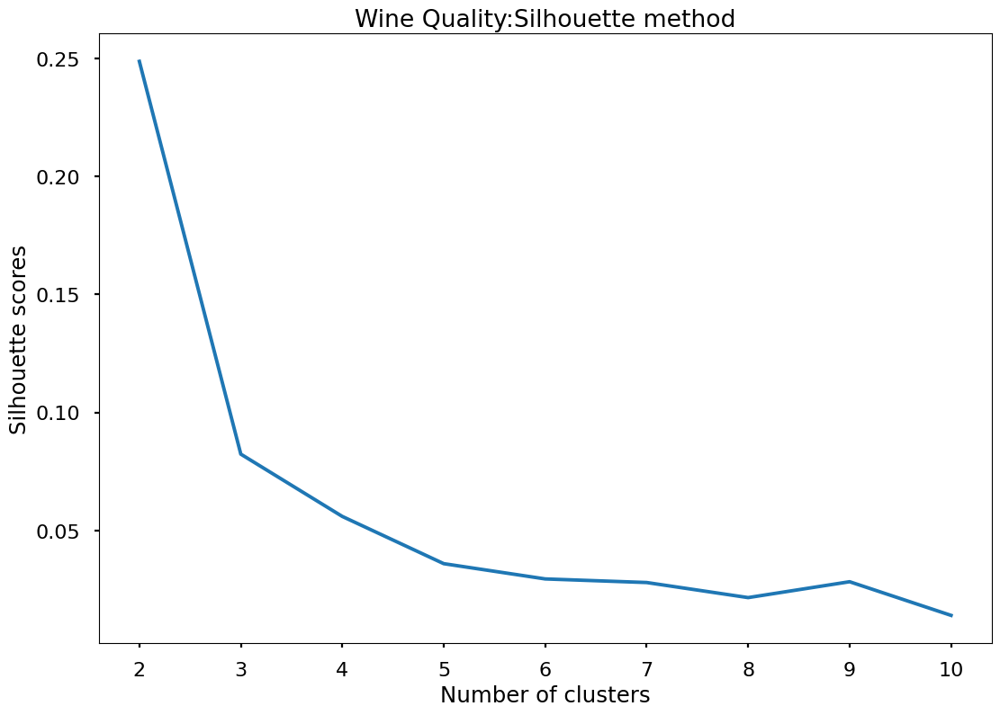

[0.24864755633481744,
 0.08234284210809005,
 0.05596753209554314,
 0.0359636888791836,
 0.029500554212917456,
 0.027979860687438626,
 0.0215930355791905,
 0.028317067666332314,
 0.014069652340471982]

In [115]:
plt.plot(range(2, 11), sil)
plt.title('Wine Quality:Silhouette method')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette scores') 
plt.savefig('./plots/WQ_P1_GMM_sil.png')
plt.show()
sil

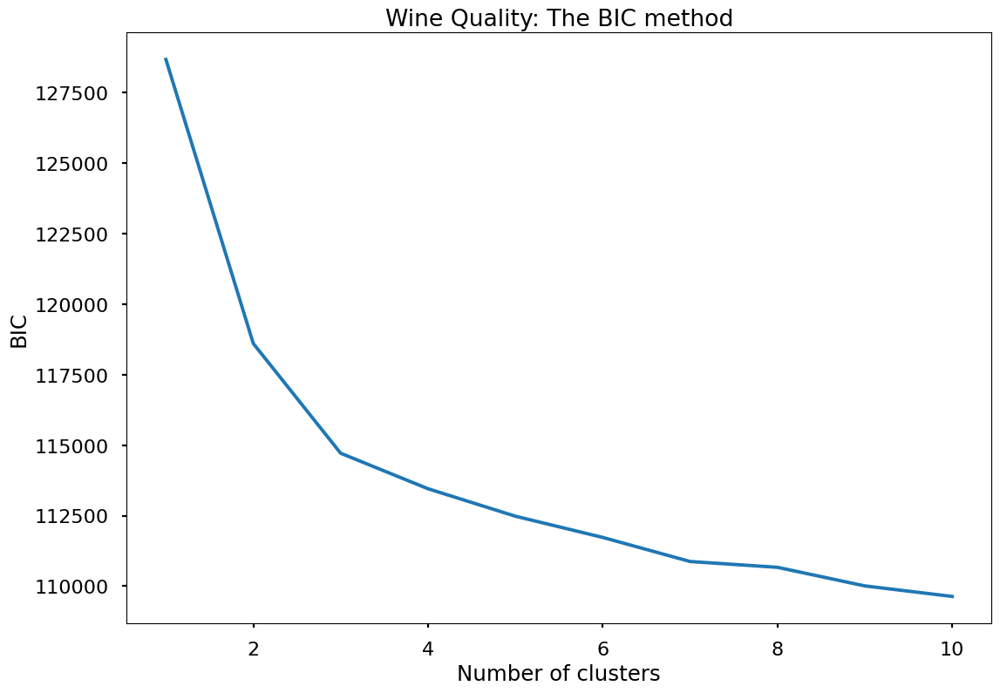

In [117]:
# BIC (Bayesian Information Criterion) method 

bic=[]

for i in range(1, 11):
    gmm = GaussianMixture(n_components = i, covariance_type='full', random_state = 2)
    gmm.fit(X)
    bic.append(gmm.bic(X))

#Plotting the results onto a line graph
plt.plot(range(1, 11), bic)
plt.title('Wine Quality: The BIC method')
plt.xlabel('Number of clusters')
plt.ylabel('BIC') 
plt.savefig('./plots/WQ_P1_GMM_bic.png')
plt.show()

# Validating the GMM clusters

In [23]:
homogeneity_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X), y)

0.06354823136251568

In [21]:
adjusted_mutual_info_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X), y)

0.04342082675720375

In [125]:
print(fowlkes_mallows_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X), y))
print(completeness_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X), y))
print(v_measure_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X), y))

0.7012481667037371
0.033209262122440575
0.043622251811709103


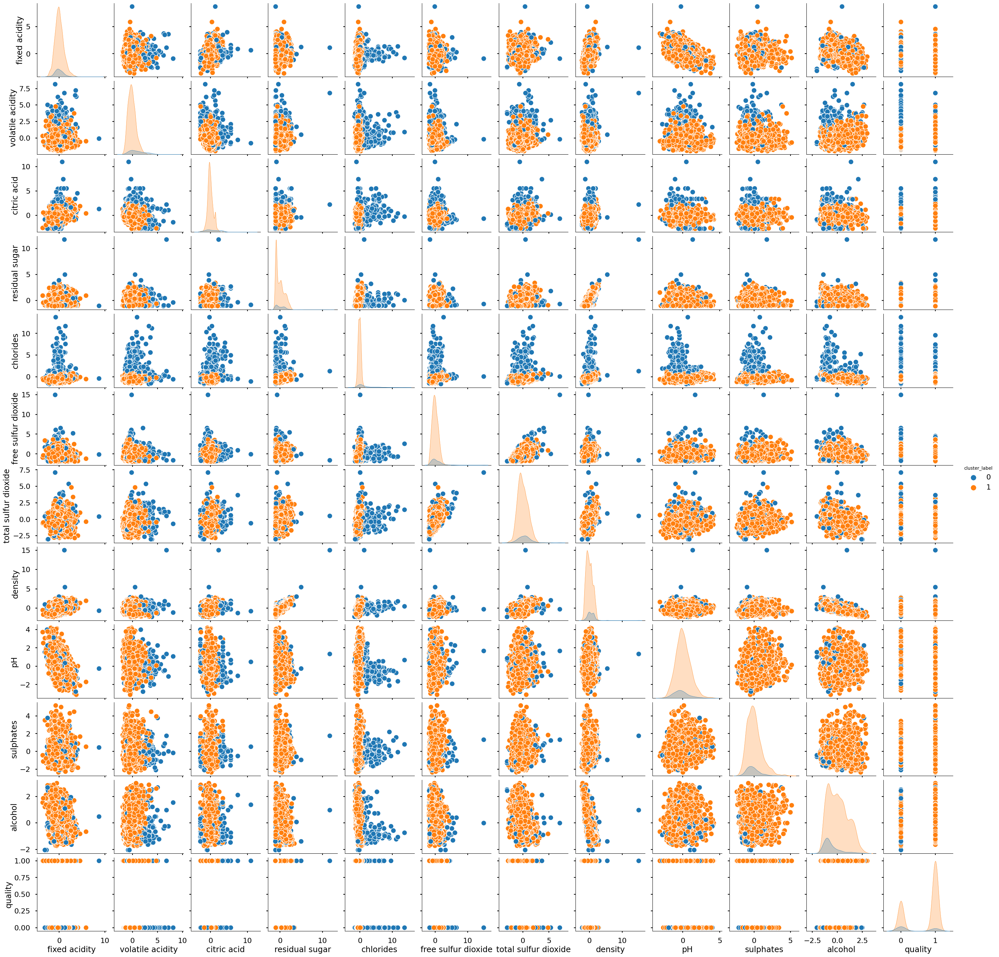

In [172]:
df = pd.DataFrame(X, columns=['fixed acidity','volatile acidity','citric acid','residual sugar','chlorides',
                             'free sulfur dioxide','total sulfur dioxide','density','pH','sulphates','alcohol'])
df['quality'] = y
df['cluster_label'] = GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)
#sns.pairplot(df[['Class','cluster_label']])
#sns.pairplot(df, hue='Class')
sns.pairplot(df, hue='cluster_label')

In [173]:
print(df.groupby(['cluster_label','quality']).count())

                       fixed acidity  volatile acidity  citric acid  \
cluster_label quality                                                 
0             0                  320               320          320   
              1                  188               188          188   
1             0                 1320              1320         1320   
              1                 3070              3070         3070   

                       residual sugar  chlorides  free sulfur dioxide  \
cluster_label quality                                                   
0             0                   320        320                  320   
              1                   188        188                  188   
1             0                  1320       1320                 1320   
              1                  3070       3070                 3070   

                       total sulfur dioxide  density    pH  sulphates  alcohol  
cluster_label quality                                

/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


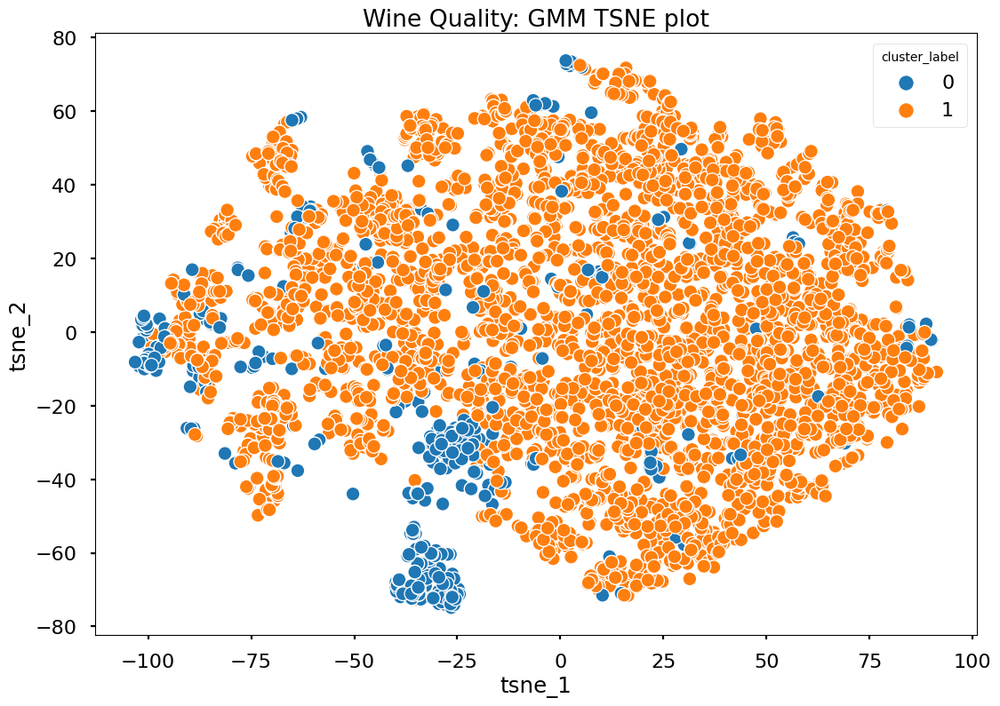

In [119]:
# Reference: https://danielmuellerkomorowska.com/2021/01/05/introduction-to-t-sne-in-python-with-scikit-learn/
from sklearn.manifold import TSNE
tsne_result = TSNE(2).fit_transform(X)
tsne_result_df = pd.DataFrame({'tsne_1': tsne_result[:,0], 'tsne_2': tsne_result[:,1], 
                               'cluster_label': GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)})
fig, ax = plt.subplots(1)
sns.scatterplot(x='tsne_1', y='tsne_2', hue='cluster_label', data=tsne_result_df, ax=ax)
plt.title('Wine Quality: GMM TSNE plot')
plt.savefig('./plots/WQ_EM_TSNE.png')

# Part 2: Dimensionality Reduction

# PCA

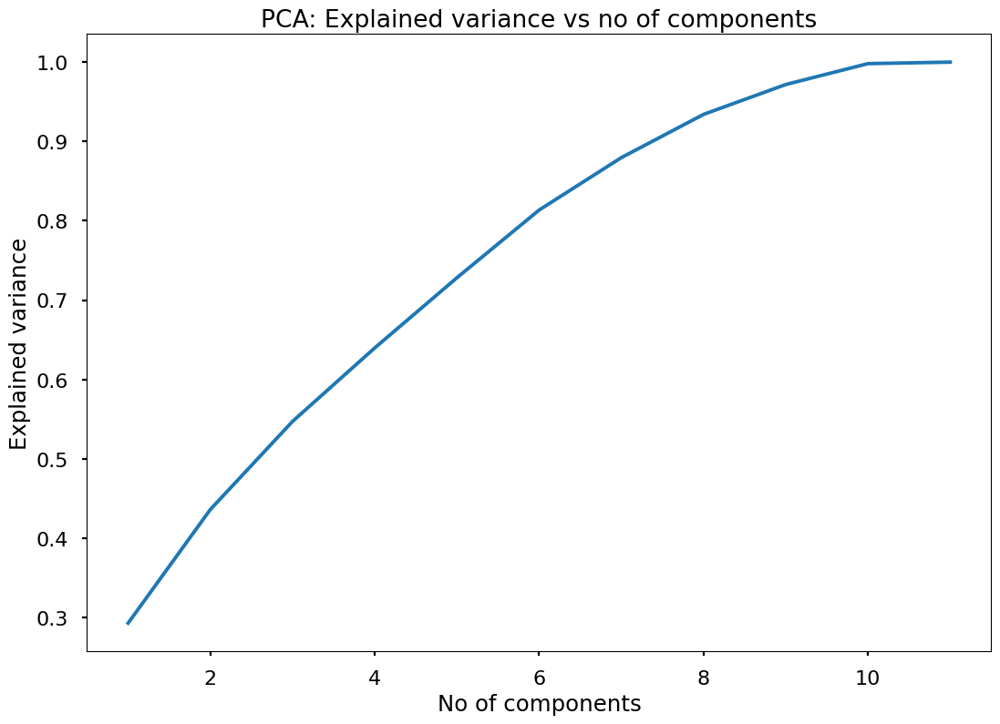

In [126]:
n_comp = np.arange(1,12,1)
exp_var = []
for i in n_comp:
    pca = PCA(n_components=i)
    pca.fit(X)
    exp_var.append(sum(pca.explained_variance_ratio_))

plt.plot(n_comp, exp_var)
plt.title('PCA: Explained variance vs no of components')
plt.xlabel('No of components')
plt.ylabel('Explained variance') 
plt.show()


In [35]:
exp_var

[0.29293217187565,
 0.43613580197390067,
 0.547196832869715,
 0.6397897742033946,
 0.7282747359911349,
 0.813614873394104,
 0.8796692391167444,
 0.9341563736297462,
 0.9718057977884462,
 0.998122810385654,
 1.0]

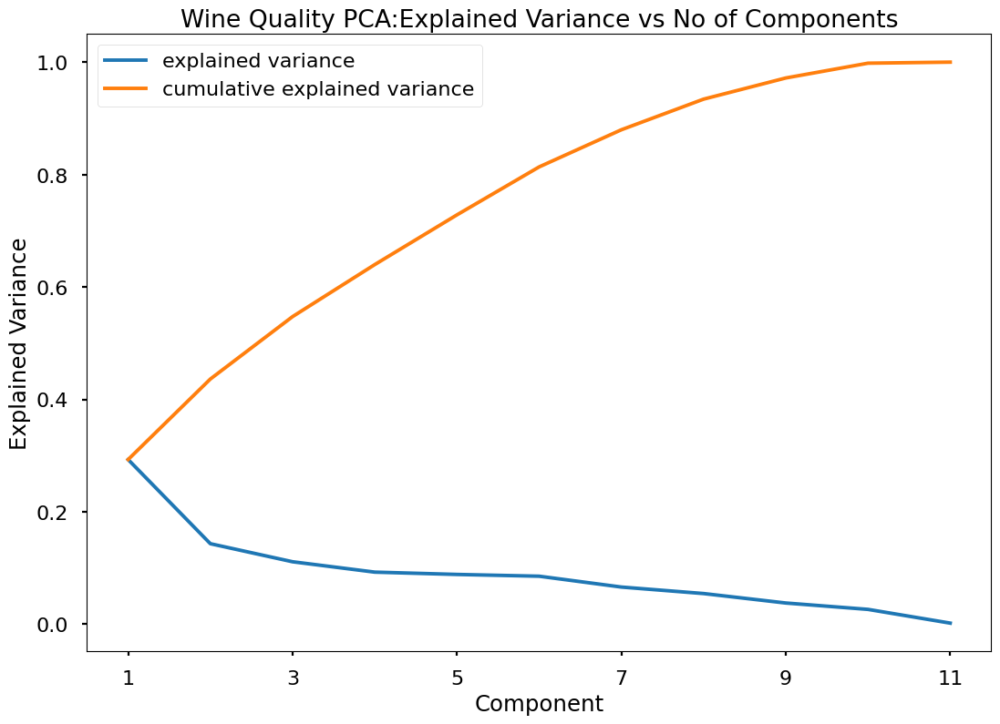

In [127]:
plt.figure()
plt.plot(np.arange(1, pca.explained_variance_ratio_.size + 1), pca.explained_variance_ratio_, label='explained variance')
plt.plot(np.arange(1, pca.explained_variance_ratio_.size + 1), np.cumsum(pca.explained_variance_ratio_), label='cumulative explained variance')
plt.xticks(np.arange(1, pca.explained_variance_ratio_.size + 1, 2))
plt.xlabel('Component')
plt.ylabel('Explained Variance')
plt.title('Wine Quality PCA:Explained Variance vs No of Components')
plt.legend()
plt.savefig('./plots/WQ_P2_PCA.png')
plt.show()

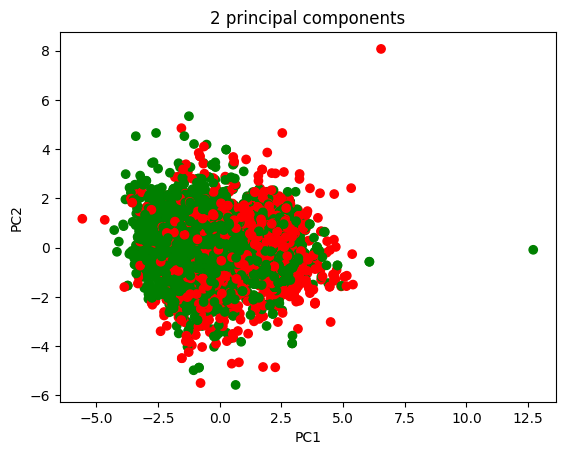

In [27]:
X_pca = PCA(n_components=2).fit_transform(X)
color= ['red' if l == 0 else 'green' for l in y]
plot = plt.scatter(X_pca[:,0], X_pca[:,1], c=color)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("2 principal components")
plt.show()

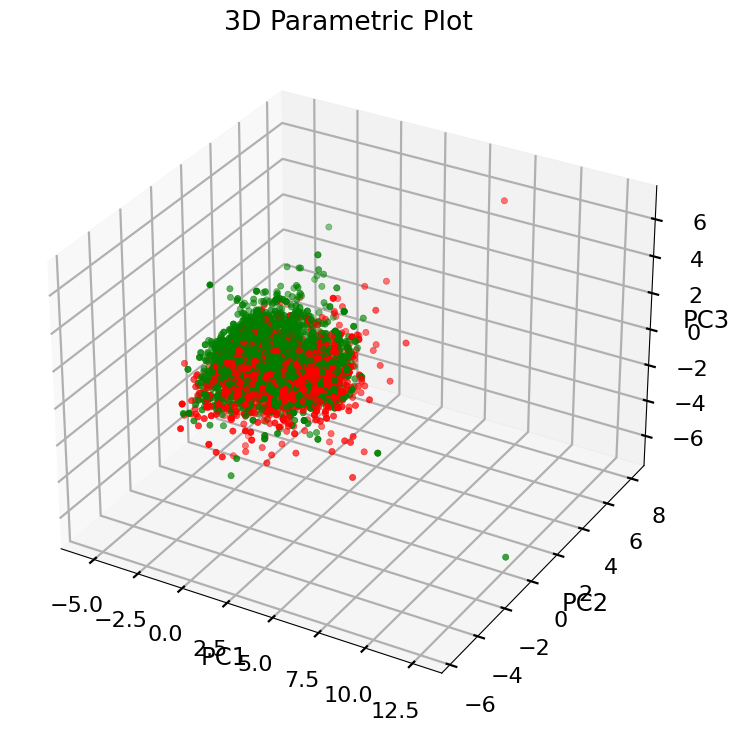

In [34]:
X_pca = PCA(n_components=3).fit_transform(X)
color= ['red' if l == 0 else 'green' for l in y]
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.grid()


#ax.plot3D(X_pca[:,0], X_pca[:,1],X_pca[:,2])
ax.scatter3D(X_pca[:,0], X_pca[:,1],X_pca[:,2], c=color)
ax.set_title('3D Parametric Plot')

# Set axes label
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

plt.show()

In [147]:
X_pca = PCA(n_components=6).fit_transform(X)

# ICA

/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/Users/anurag/opt/miniconda3/l

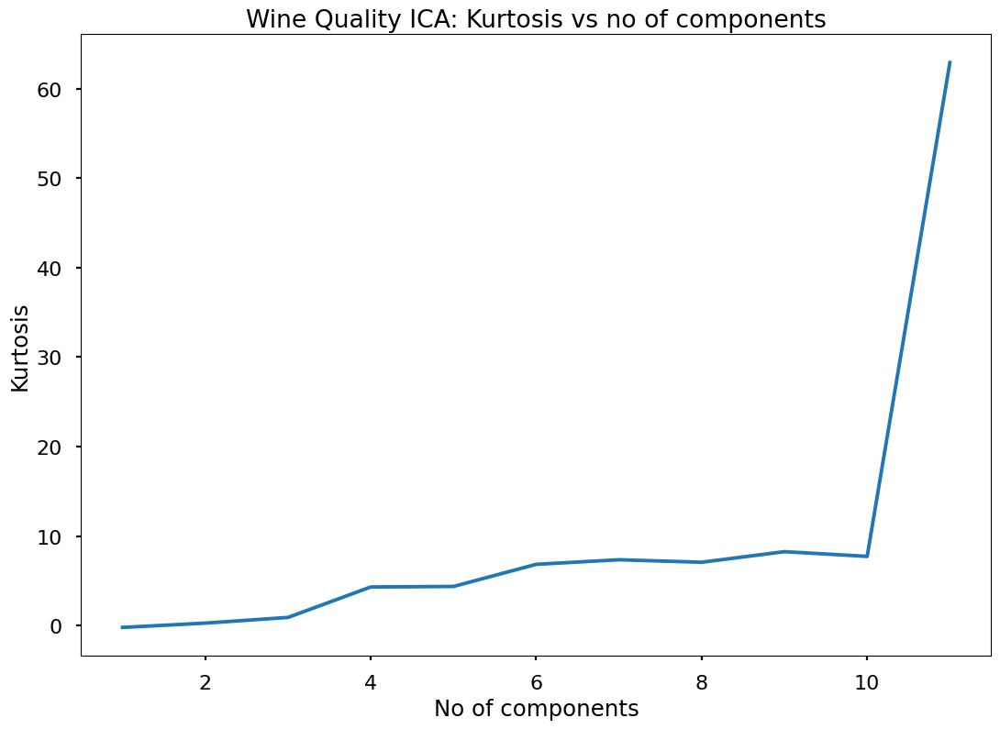

In [128]:
n_comp = np.arange(1,12,1)
kurt = []
for i in n_comp:
    ica = FastICA(n_components=i).fit_transform(X)
    kurt.append(np.mean(scipy.stats.kurtosis(ica)))

plt.plot(n_comp, kurt)
plt.title('Wine Quality ICA: Kurtosis vs no of components')
plt.xlabel('No of components')
plt.ylabel('Kurtosis') 
plt.savefig('./plots/WQ_P2_ICA.png')
plt.show()

/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


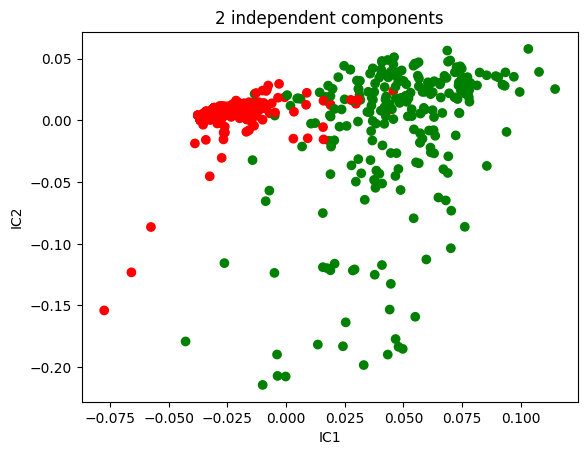

In [73]:
X_ica = FastICA(n_components=2).fit_transform(X)
color= ['red' if l == 0 else 'green' for l in y]
plot = plt.scatter(X_ica[:,0], X_ica[:,1], c=color)
plt.xlabel("IC1")
plt.ylabel("IC2")
plt.title("ICA: 2 independent components")
plt.show()

In [148]:
X_ica = FastICA(n_components=11).fit_transform(X)

/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:494: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


# Random Projections

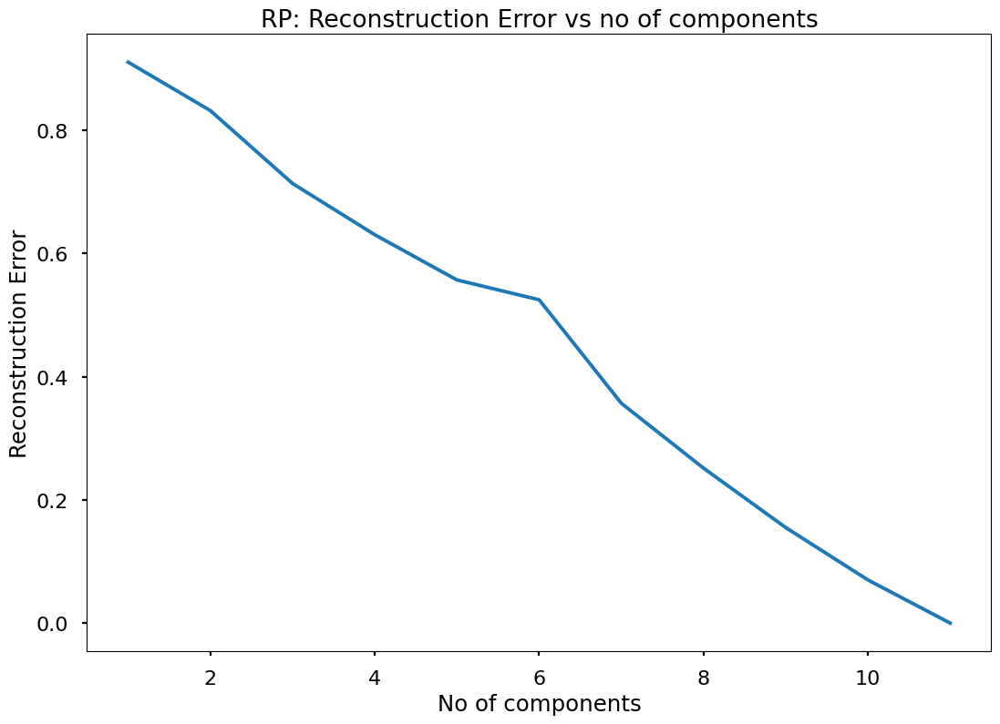

In [40]:
reconstruction_error = []
for i in range(1,12):
    rp = GaussianRandomProjection(n_components=i).fit(X)
    w = rp.components_
    p = pinv(w)
    recon = ((p@w)@(X.T)).T
    reconstruction_error.append(mean_squared_error(X,recon))
    
plt.plot(np.arange(1,12,1), reconstruction_error)
plt.title('RP: Reconstruction Error vs no of components')
plt.xlabel('No of components')
plt.ylabel('Reconstruction Error') 
plt.show()    

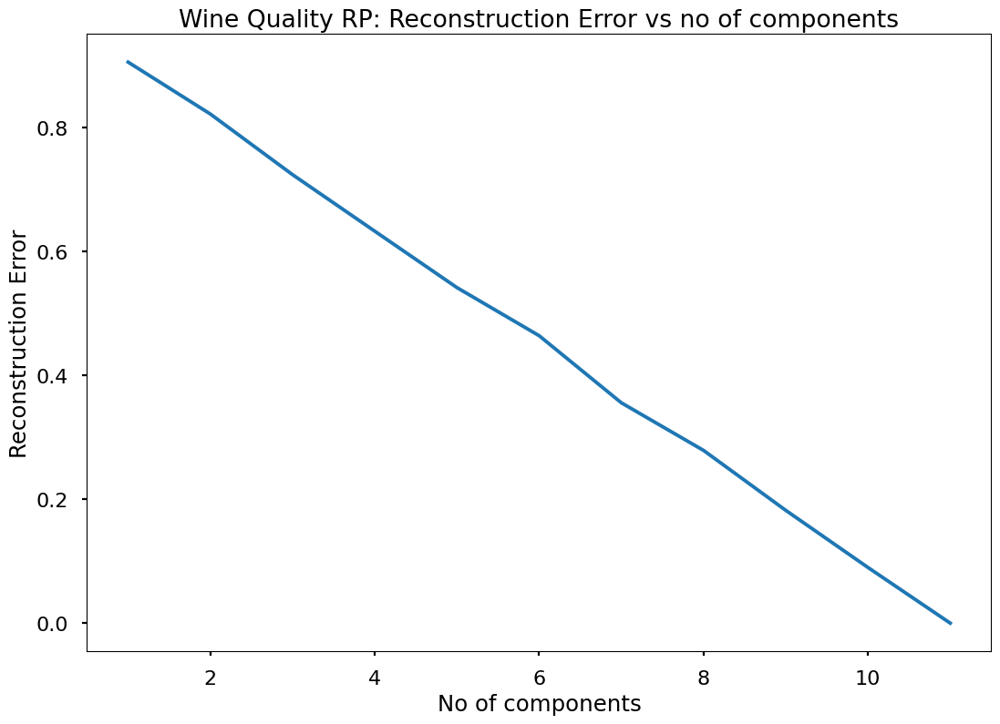

In [133]:
reconstruction_error = []
for i in range(1,12):
    recon_inner = []
    for j in range(1,100):
        rp = GaussianRandomProjection(n_components=i).fit(X)
        w = rp.components_
        p = pinv(w)
        recon = ((p@w)@(X.T)).T
        recon_inner.append(mean_squared_error(X,recon))
    reconstruction_error.append(np.mean(recon_inner))
    
plt.plot(np.arange(1,12,1), reconstruction_error)
plt.title('Wine Quality RP: Reconstruction Error vs no of components')
plt.xlabel('No of components')
plt.ylabel('Reconstruction Error')
plt.savefig('./plots/WQ_P2_RP.png')
plt.show()    

In [97]:
reconstruction_error

[0.9082728452772699,
 0.8220357425055993,
 0.7272321232175996,
 0.6350523272212666,
 0.5440970152283392,
 0.4600862125563922,
 0.3592736617108149,
 0.26694094656495665,
 0.17908571361999634,
 0.09032358217424949,
 4.028038739722754e-28]

In [150]:
X_RP = GaussianRandomProjection(n_components=6).fit_transform(X)

# Feature Selection of Choice

In [151]:
# Reference: https://scikit-learn.org/stable/modules/feature_selection.html

clf = ExtraTreesClassifier(n_estimators=50)
clf.fit(X,y)
print(clf.feature_importances_)
model = SelectFromModel(clf, prefit=True)
X_fs = model.transform(X)
print(X_fs.shape)

[0.07241153 0.11674234 0.08243885 0.07534749 0.07509377 0.08947538
 0.08074865 0.09493205 0.07649864 0.06987796 0.16643334]
(4898, 3)


# Part 3: Clustering with Dimensionality Reduction

In [137]:
def kmeans_comparison(df):
    cluster_size = np.arange(1,11,1)
    
    # Elbow & Silhouette method
    inertia_list = []
    sil_scores = []
    for i in cluster_size:
        cluster_algo = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, random_state = 11)
        cluster_labels = cluster_algo.fit_predict(df)
        inertia_list.append(cluster_algo.inertia_)
        if i > 1:
            sil_scores.append(silhouette_score(df, cluster_labels))
        
    return inertia_list,sil_scores
    
baseline_val = kmeans_comparison(X)
pca_val = kmeans_comparison(X_pca)
ica_val = kmeans_comparison(X_ica)
rp_val = kmeans_comparison(X_RP)
fs_val = kmeans_comparison(X_fs)

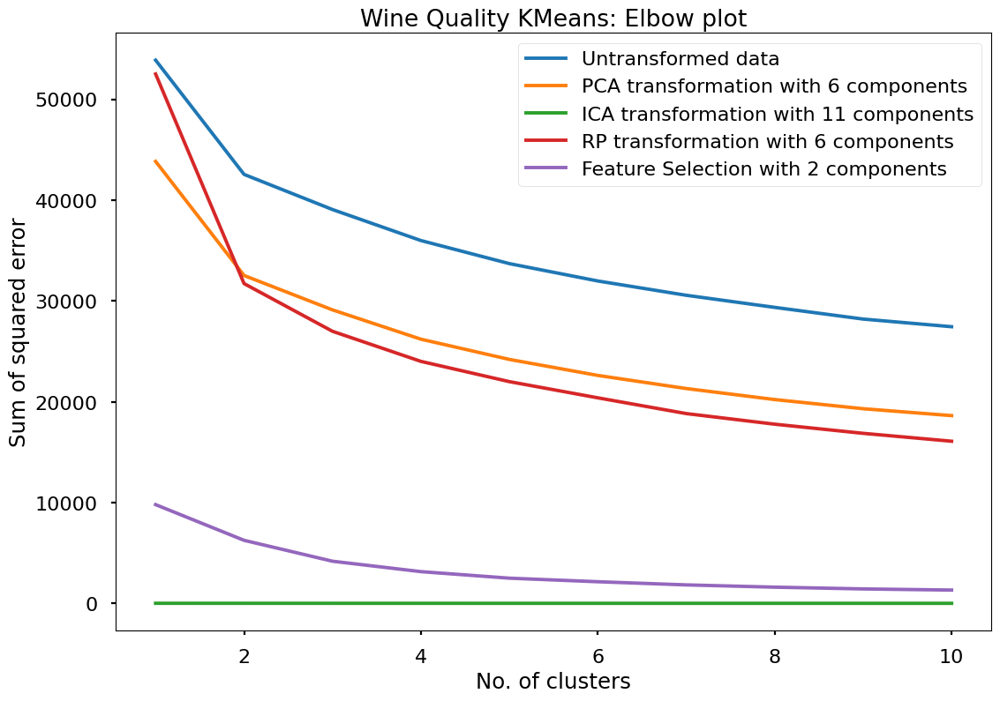

In [138]:
# Elbow plot
plt.plot(np.arange(1,11,1), baseline_val[0], label = 'Untransformed data')
plt.plot(np.arange(1,11,1), pca_val[0], label = 'PCA transformation with 6 components')
plt.plot(np.arange(1,11,1), ica_val[0], label = 'ICA transformation with 11 components')
plt.plot(np.arange(1,11,1), rp_val[0], label = 'RP transformation with 6 components')
plt.plot(np.arange(1,11,1), fs_val[0], label = 'Feature Selection with 2 components')
plt.title('Wine Quality KMeans: Elbow plot')
plt.xlabel('No. of clusters')
plt.ylabel('Sum of squared error')
plt.legend()
plt.savefig('./plots/WQ_P3_KM_elbow.png')
plt.show()

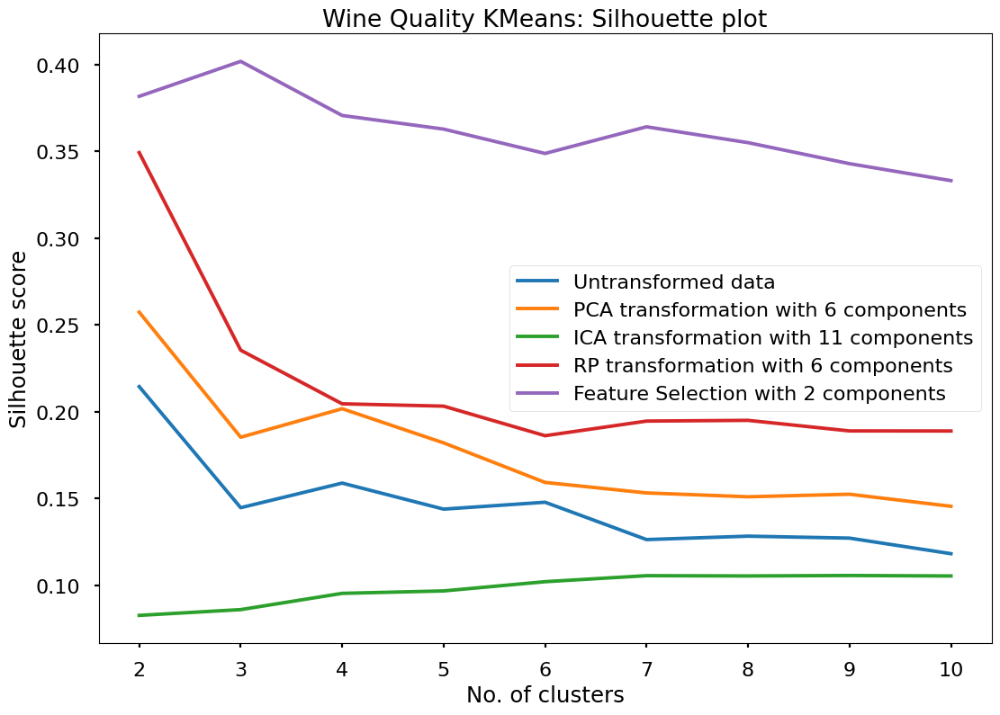

In [139]:
# Silhouette plot
plt.plot(np.arange(2,11,1), baseline_val[1], label = 'Untransformed data')
plt.plot(np.arange(2,11,1), pca_val[1], label = 'PCA transformation with 6 components')
plt.plot(np.arange(2,11,1), ica_val[1], label = 'ICA transformation with 11 components')
plt.plot(np.arange(2,11,1), rp_val[1], label = 'RP transformation with 6 components')
plt.plot(np.arange(2,11,1), fs_val[1], label = 'Feature Selection with 2 components')
plt.title('Wine Quality KMeans: Silhouette plot')
plt.xlabel('No. of clusters')
plt.ylabel('Silhouette score')
plt.legend()
plt.savefig('./plots/WQ_P3_KM_sil.png')
plt.show()

In [140]:
def gmm_comparison(df):
    cluster_size = np.arange(1,11,1)
        
    # BIC & Silhouette method
    bic_list = []
    sil_scores = []
    for i in cluster_size:
        cluster_algo = GaussianMixture(n_components=i, covariance_type='full')
        cluster_labels = cluster_algo.fit_predict(df)
        bic_list.append(cluster_algo.bic(df))
        if i > 1:
            sil_scores.append(silhouette_score(df, cluster_labels))
    
    #print(sil_scores)
    return bic_list,sil_scores
    
baseline_val = gmm_comparison(X)
pca_val = gmm_comparison(X_pca)
ica_val = gmm_comparison(X_ica)
rp_val = gmm_comparison(X_RP)
fs_val = gmm_comparison(X_fs)

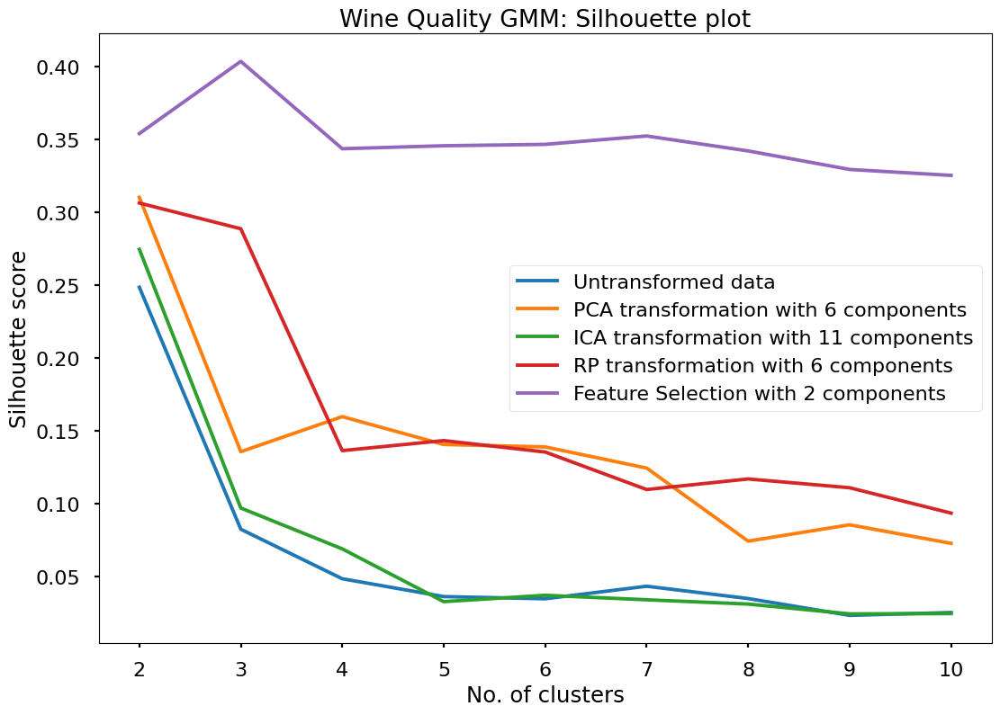

In [141]:
# Silhouette plot
plt.plot(np.arange(2,11,1), baseline_val[1], label = 'Untransformed data')
plt.plot(np.arange(2,11,1), pca_val[1], label = 'PCA transformation with 6 components')
plt.plot(np.arange(2,11,1), ica_val[1], label = 'ICA transformation with 11 components')
plt.plot(np.arange(2,11,1), rp_val[1], label = 'RP transformation with 6 components')
plt.plot(np.arange(2,11,1), fs_val[1], label = 'Feature Selection with 2 components')
plt.title('Wine Quality GMM: Silhouette plot')
plt.xlabel('No. of clusters')
plt.ylabel('Silhouette score')
plt.legend()
plt.savefig('./plots/WQ_P3_EM_sil.png')
plt.show()

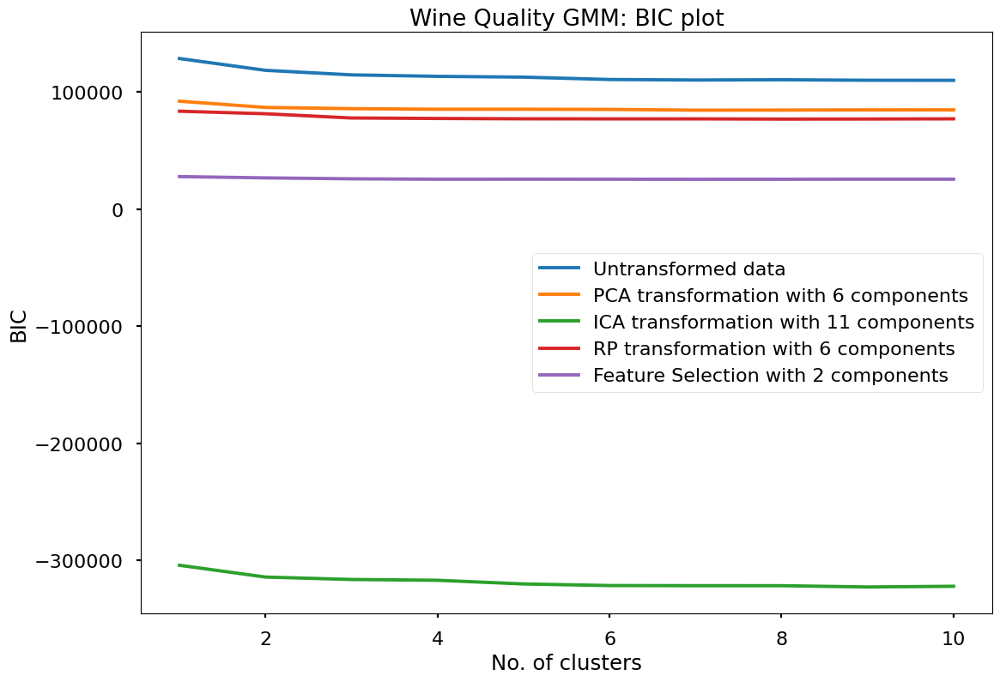

In [142]:
# BIC plot
plt.plot(np.arange(1,11,1), baseline_val[0], label = 'Untransformed data')
plt.plot(np.arange(1,11,1), pca_val[0], label = 'PCA transformation with 6 components')
plt.plot(np.arange(1,11,1), ica_val[0], label = 'ICA transformation with 11 components')
plt.plot(np.arange(1,11,1), rp_val[0], label = 'RP transformation with 6 components')
plt.plot(np.arange(1,11,1), fs_val[0], label = 'Feature Selection with 2 components')
plt.title('Wine Quality GMM: BIC plot')
plt.xlabel('No. of clusters')
plt.ylabel('BIC')
plt.legend()
plt.savefig('./plots/WQ_P3_EM_bic.png')
plt.show()

# KMeans on un-transformed data

In [53]:
print("Homogeneity score:",homogeneity_score(KMeans(n_clusters=2, random_state=12).fit_predict(X), y))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(KMeans(n_clusters=2, random_state=12).fit_predict(X), y))

Homogeneity score: 0.03809468621562412
Adjusted Mutual Information: 0.038972964415900736


# KMeans on PCA transformed data

In [152]:
print("Homogeneity score:",homogeneity_score(KMeans(n_clusters=2, random_state=12).fit_predict(X_pca), y))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(KMeans(n_clusters=2, random_state=12).fit_predict(X_pca), y))
print("Fowlkes Mallows Score:",fowlkes_mallows_score(KMeans(n_clusters=2, random_state=12).fit_predict(X_pca), y))


Homogeneity score: 0.038619845225374996
Adjusted Mutual Information: 0.039552239256726136
Fowlkes Mallows Score: 0.5697928324097435


In [174]:
print("Homogeneity score:",homogeneity_score(KMeans(n_clusters=2, random_state=12).fit_predict(X_pca), KMeans(n_clusters=2, random_state=12).fit_predict(X)))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(KMeans(n_clusters=2, random_state=12).fit_predict(X_pca), KMeans(n_clusters=2, random_state=12).fit_predict(X)))
print("Fowlkes Mallows Score:",fowlkes_mallows_score(KMeans(n_clusters=2, random_state=12).fit_predict(X_pca), KMeans(n_clusters=2, random_state=12).fit_predict(X)))



Homogeneity score: 0.95695010781647
Adjusted Mutual Information: 0.9579280594743868
Fowlkes Mallows Score: 0.9909992176262135


In [55]:
# Not valid for this data
# color= ['red' if l == 0 else 'green' for l in KMeans(n_clusters=2, random_state=12).fit_predict(X_pca)]
# plot = plt.scatter(X_pca[:,0], X_pca[:,1], c=color)
# plt.xlabel("PC1")
# plt.ylabel("PC2")
# plt.title("2 principal components")
# plt.show()

/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


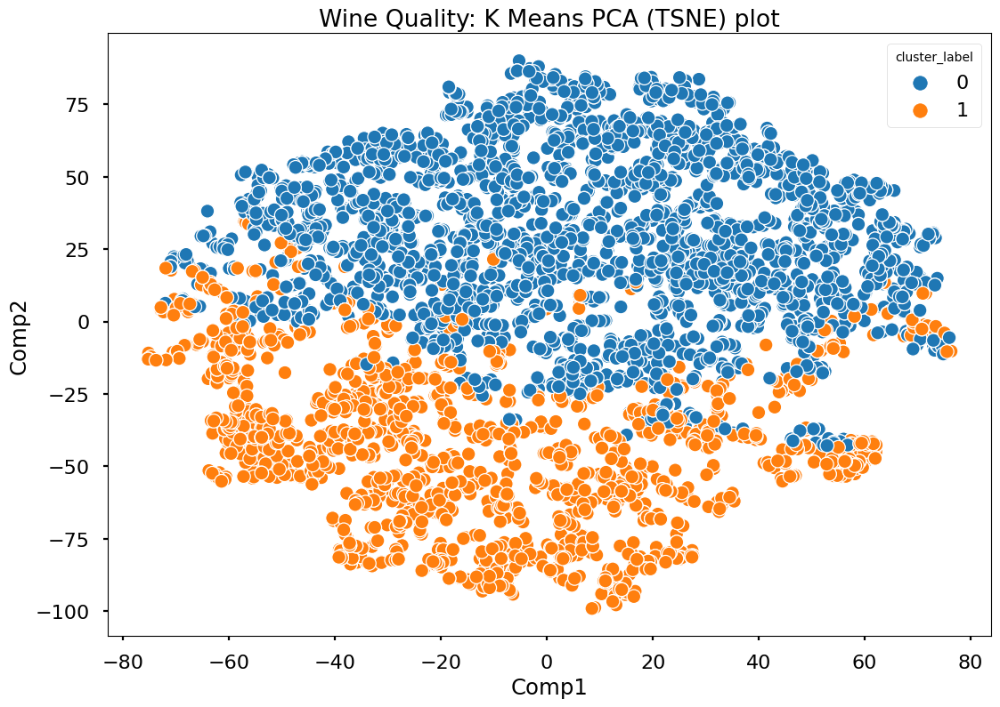

In [155]:
# Reference: https://danielmuellerkomorowska.com/2021/01/05/introduction-to-t-sne-in-python-with-scikit-learn/
from sklearn.manifold import TSNE
tsne_result = TSNE(2).fit_transform(X_pca)
tsne_result_df = pd.DataFrame({'Comp1': tsne_result[:,0], 'Comp2': tsne_result[:,1], 
                               'cluster_label': KMeans(n_clusters=2, random_state=12).fit_predict(X_pca)})
fig, ax = plt.subplots(1)
sns.scatterplot(x='Comp1', y='Comp2', hue='cluster_label', data=tsne_result_df, ax=ax)
plt.title('Wine Quality: K Means PCA (TSNE) plot')
plt.savefig('./plots/WQ_P3_KM_PCA.png')

# KMeans on ICA transformed data

In [153]:
print("Homogeneity score:",homogeneity_score(KMeans(n_clusters=7, random_state=12).fit_predict(X_ica), y))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(KMeans(n_clusters=7, random_state=12).fit_predict(X_ica), y))
print("Fowlkes Mallows Score:",fowlkes_mallows_score(KMeans(n_clusters=7, random_state=12).fit_predict(X_ica), y))



Homogeneity score: 0.04675096103686827
Adjusted Mutual Information: 0.06892909072965253
Fowlkes Mallows Score: 0.35528860982390614


In [175]:
print("Homogeneity score:",homogeneity_score(KMeans(n_clusters=7, random_state=12).fit_predict(X_ica), KMeans(n_clusters=2, random_state=12).fit_predict(X)))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(KMeans(n_clusters=7, random_state=12).fit_predict(X_ica), KMeans(n_clusters=2, random_state=12).fit_predict(X)))
print("Fowlkes Mallows Score:",fowlkes_mallows_score(KMeans(n_clusters=7, random_state=12).fit_predict(X_ica), KMeans(n_clusters=2, random_state=12).fit_predict(X)))


Homogeneity score: 0.14242390127888868
Adjusted Mutual Information: 0.20802732474542782
Fowlkes Mallows Score: 0.4276719172202494


/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


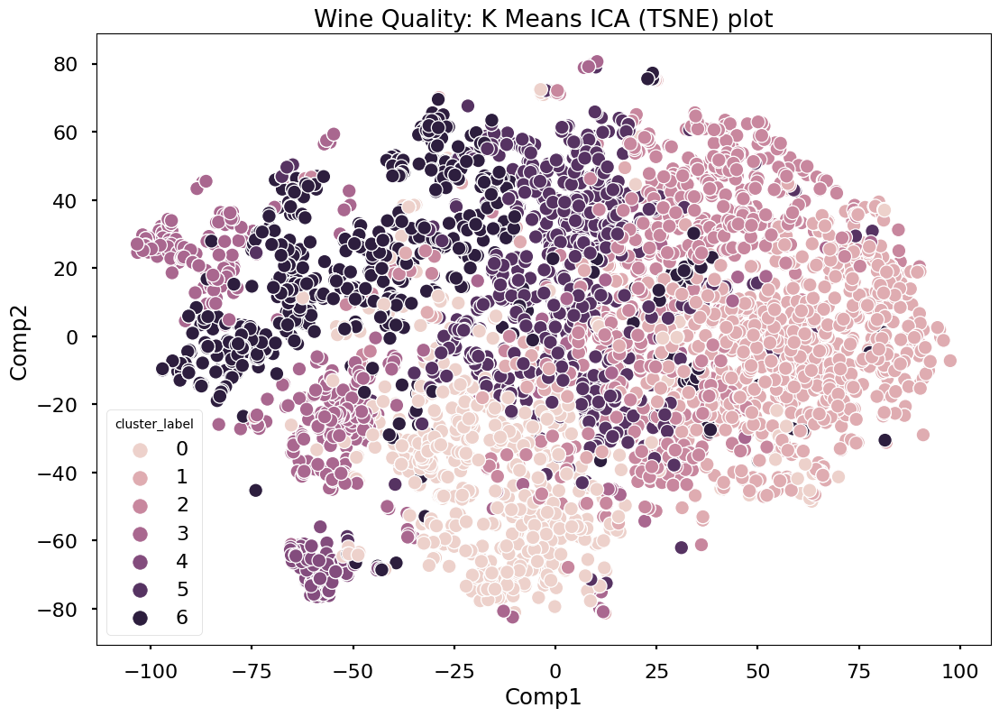

In [156]:
# Reference: https://danielmuellerkomorowska.com/2021/01/05/introduction-to-t-sne-in-python-with-scikit-learn/
from sklearn.manifold import TSNE
tsne_result = TSNE(2).fit_transform(X_ica)
tsne_result_df = pd.DataFrame({'Comp1': tsne_result[:,0], 'Comp2': tsne_result[:,1], 
                               'cluster_label': KMeans(n_clusters=7, random_state=12).fit_predict(X_ica)})
fig, ax = plt.subplots(1)
sns.scatterplot(x='Comp1', y='Comp2', hue='cluster_label', data=tsne_result_df, ax=ax)
plt.title('Wine Quality: K Means ICA (TSNE) plot')
plt.savefig('./plots/WQ_P3_KM_ICA.png')

In [81]:
# Not valid for this data
# color= ['red' if l == 0 else 'blue' if l == 1 else 'green' for l in KMeans(n_clusters=3, random_state=12).fit_predict(X_ica)]
# plot = plt.scatter(X_ica[:,0], X_ica[:,1], c=color)
# plt.xlabel("IC1")
# plt.ylabel("IC2")
# plt.title("2 independent components")
# plt.show()

# KMeans on Random Projections transformed data

In [157]:
print("Homogeneity score:",homogeneity_score(KMeans(n_clusters=2, random_state=12).fit_predict(X_RP), y))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(KMeans(n_clusters=2, random_state=12).fit_predict(X_RP), y))
print("Fowlkes Mallows Score:",fowlkes_mallows_score(KMeans(n_clusters=2, random_state=12).fit_predict(X_RP), y))


Homogeneity score: 0.03279685643037828
Adjusted Mutual Information: 0.033417288152726175
Fowlkes Mallows Score: 0.5698033971641989


In [176]:
print("Homogeneity score:",homogeneity_score(KMeans(n_clusters=2, random_state=12).fit_predict(X_RP), KMeans(n_clusters=2, random_state=12).fit_predict(X)))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(KMeans(n_clusters=2, random_state=12).fit_predict(X_RP), KMeans(n_clusters=2, random_state=12).fit_predict(X)))
print("Fowlkes Mallows Score:",fowlkes_mallows_score(KMeans(n_clusters=2, random_state=12).fit_predict(X_RP), KMeans(n_clusters=2, random_state=12).fit_predict(X)))



Homogeneity score: 0.5493226142939067
Adjusted Mutual Information: 0.5473519075847126
Fowlkes Mallows Score: 0.8405485059930488


/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


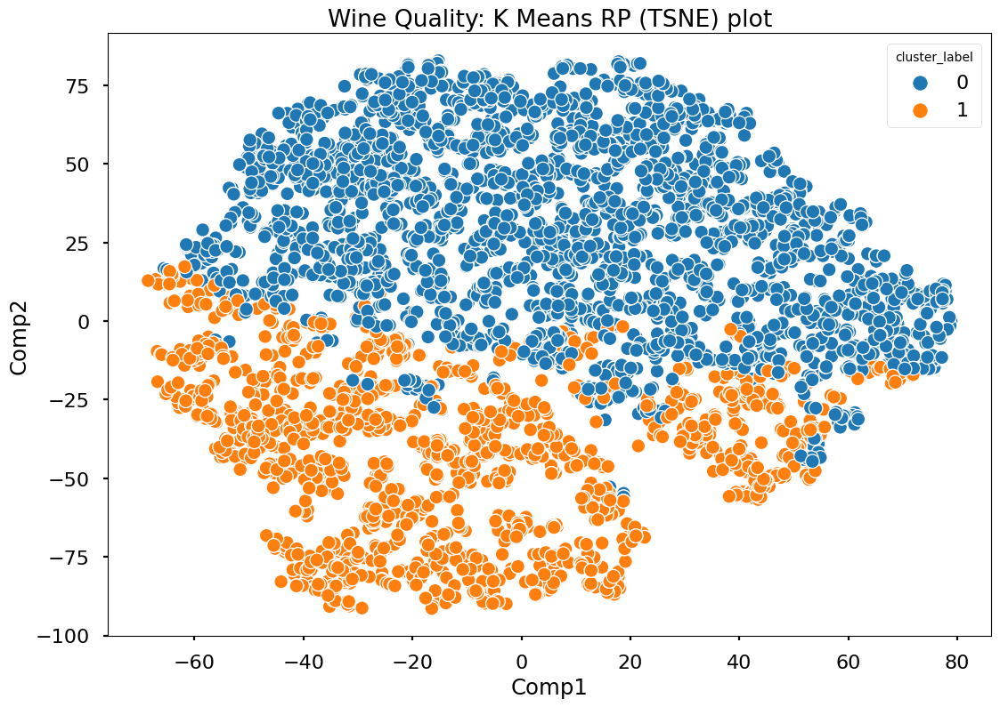

In [159]:
# Reference: https://danielmuellerkomorowska.com/2021/01/05/introduction-to-t-sne-in-python-with-scikit-learn/
from sklearn.manifold import TSNE
tsne_result = TSNE(2).fit_transform(X_RP)
tsne_result_df = pd.DataFrame({'Comp1': tsne_result[:,0], 'Comp2': tsne_result[:,1], 
                               'cluster_label': KMeans(n_clusters=2, random_state=12).fit_predict(X_RP)})
fig, ax = plt.subplots(1)
sns.scatterplot(x='Comp1', y='Comp2', hue='cluster_label', data=tsne_result_df, ax=ax)
plt.title('Wine Quality: K Means RP (TSNE) plot')
plt.savefig('./plots/WQ_P3_KM_RP.png')

# KMeans on Feature Selection transformed data

In [158]:
print("Homogeneity score:",homogeneity_score(KMeans(n_clusters=3, random_state=12).fit_predict(X_fs), y))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(KMeans(n_clusters=3, random_state=12).fit_predict(X_fs), y))
print("Fowlkes Mallows Score:",fowlkes_mallows_score(KMeans(n_clusters=3, random_state=12).fit_predict(X_fs), y))



Homogeneity score: 0.06774255853184459
Adjusted Mutual Information: 0.08121088466592417
Fowlkes Mallows Score: 0.5249636360278134


In [177]:
print("Homogeneity score:",homogeneity_score(KMeans(n_clusters=3, random_state=12).fit_predict(X_fs), KMeans(n_clusters=2, random_state=12).fit_predict(X)))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(KMeans(n_clusters=3, random_state=12).fit_predict(X_fs), KMeans(n_clusters=2, random_state=12).fit_predict(X)))
print("Fowlkes Mallows Score:",fowlkes_mallows_score(KMeans(n_clusters=3, random_state=12).fit_predict(X_fs), KMeans(n_clusters=2, random_state=12).fit_predict(X)))




Homogeneity score: 0.2737144784506703
Adjusted Mutual Information: 0.32178948169244787
Fowlkes Mallows Score: 0.6556415252195864


/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


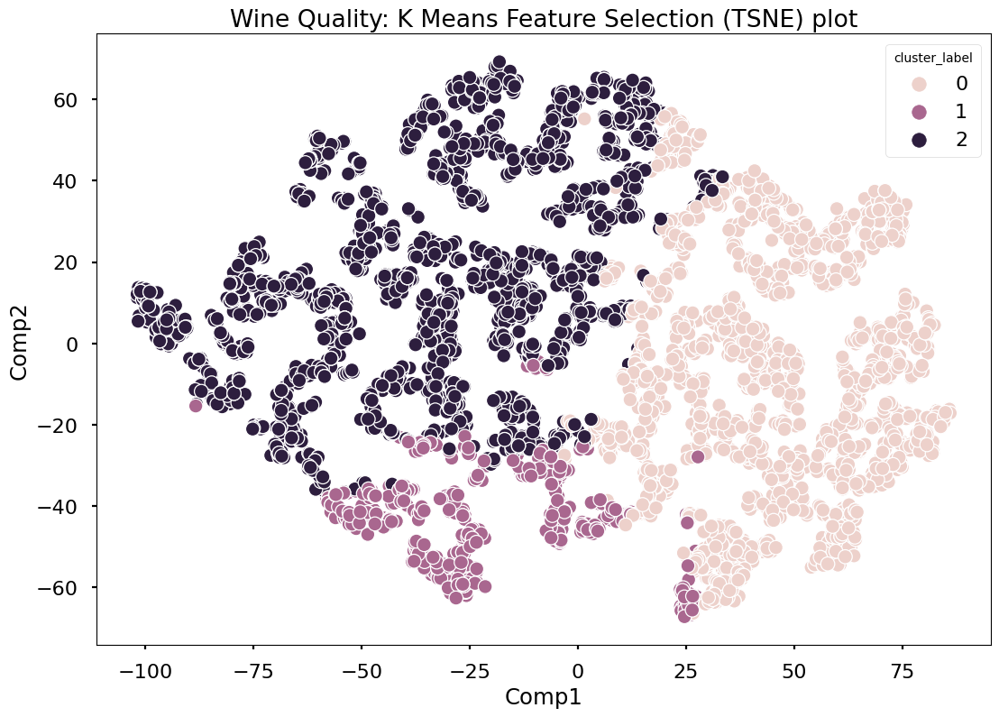

In [160]:
# Reference: https://danielmuellerkomorowska.com/2021/01/05/introduction-to-t-sne-in-python-with-scikit-learn/
from sklearn.manifold import TSNE
tsne_result = TSNE(2).fit_transform(X_fs)
tsne_result_df = pd.DataFrame({'Comp1': tsne_result[:,0], 'Comp2': tsne_result[:,1], 
                               'cluster_label': KMeans(n_clusters=3, random_state=12).fit_predict(X_fs)})
fig, ax = plt.subplots(1)
sns.scatterplot(x='Comp1', y='Comp2', hue='cluster_label', data=tsne_result_df, ax=ax)
plt.title('Wine Quality: K Means Feature Selection (TSNE) plot')
plt.savefig('./plots/WQ_P3_KM_FS.png')

# EM on un-transformed data

In [66]:
print("Homogeneity score:",homogeneity_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X), y))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X), y))

Homogeneity score: 0.06354823136251568
Adjusted Mutual Information: 0.04342082675720375


# EM on PCA transformed data

In [161]:
print("Homogeneity score:",homogeneity_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_pca), y))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_pca), y))
print("Fowlkes Mallows score:",fowlkes_mallows_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_pca), y))



Homogeneity score: 0.05088920956328725
Adjusted Mutual Information: 0.029718889630021887
Fowlkes Mallows score: 0.710956403395648


In [178]:
print("Homogeneity score:",homogeneity_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_pca), GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_pca), GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)))
print("Fowlkes Mallows score:",fowlkes_mallows_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_pca), GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)))




Homogeneity score: 0.5211460720506971
Adjusted Mutual Information: 0.4609450741992218
Fowlkes Mallows score: 0.9434484997824566


/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


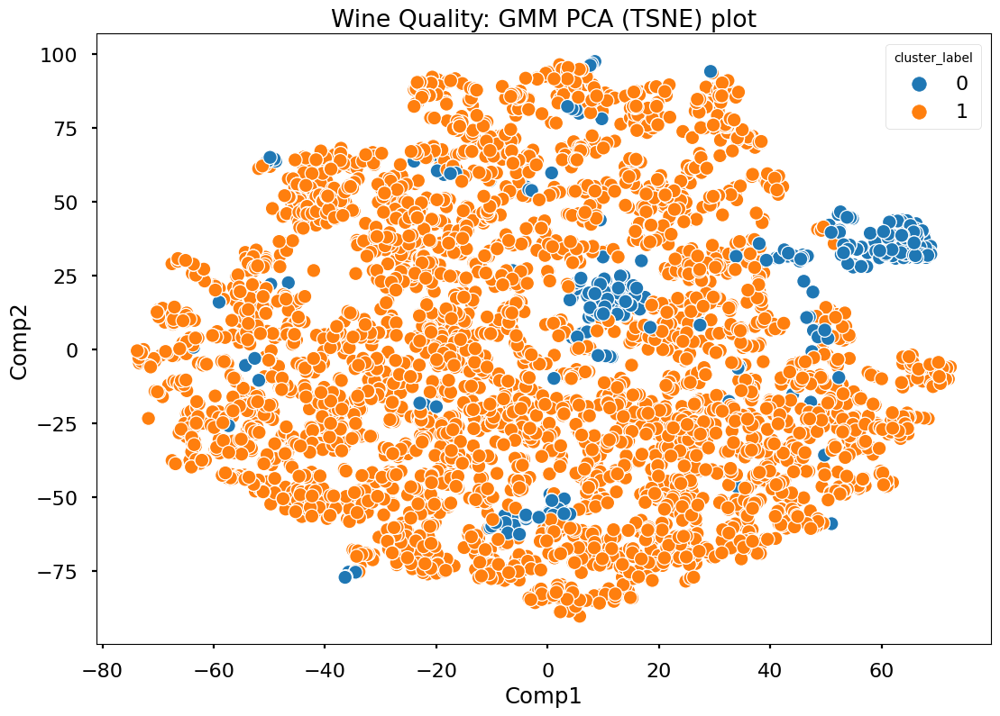

In [162]:
# Reference: https://danielmuellerkomorowska.com/2021/01/05/introduction-to-t-sne-in-python-with-scikit-learn/
from sklearn.manifold import TSNE
tsne_result = TSNE(2).fit_transform(X_pca)
tsne_result_df = pd.DataFrame({'Comp1': tsne_result[:,0], 'Comp2': tsne_result[:,1], 
                               'cluster_label': GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_pca)})
fig, ax = plt.subplots(1)
sns.scatterplot(x='Comp1', y='Comp2', hue='cluster_label', data=tsne_result_df, ax=ax)
plt.title('Wine Quality: GMM PCA (TSNE) plot')
plt.savefig('./plots/WQ_P3_EM_PCA.png')

In [65]:
# Not valid for this data
# color= ['red' if l == 0 else 'green' for l in GaussianMixture(n_components=2, covariance_type='full', random_state=12).fit_predict(X_pca)]
# plot = plt.scatter(X_pca[:,0], X_pca[:,1], c=color)
# plt.xlabel("PC1")
# plt.ylabel("PC2")
# plt.title("2 principal components")
# plt.show()

# EM on ICA transformed data

In [163]:
print("Homogeneity score:",homogeneity_score(GaussianMixture(n_components=7, covariance_type='full').fit_predict(X_ica), y))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(GaussianMixture(n_components=7, covariance_type='full').fit_predict(X_ica), y))
print("Fowlkes Mallows score:",fowlkes_mallows_score(GaussianMixture(n_components=7, covariance_type='full').fit_predict(X_ica), y))


Homogeneity score: 0.037764212746401286
Adjusted Mutual Information: 0.0452939905823154
Fowlkes Mallows score: 0.3748622377535795


In [179]:
print("Homogeneity score:",homogeneity_score(GaussianMixture(n_components=7, covariance_type='full').fit_predict(X_ica), GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(GaussianMixture(n_components=7, covariance_type='full').fit_predict(X_ica), GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)))
print("Fowlkes Mallows score:",fowlkes_mallows_score(GaussianMixture(n_components=7, covariance_type='full').fit_predict(X_ica), GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)))



Homogeneity score: 0.10995137071618832
Adjusted Mutual Information: 0.11656886978315638
Fowlkes Mallows score: 0.4708417835425055


/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


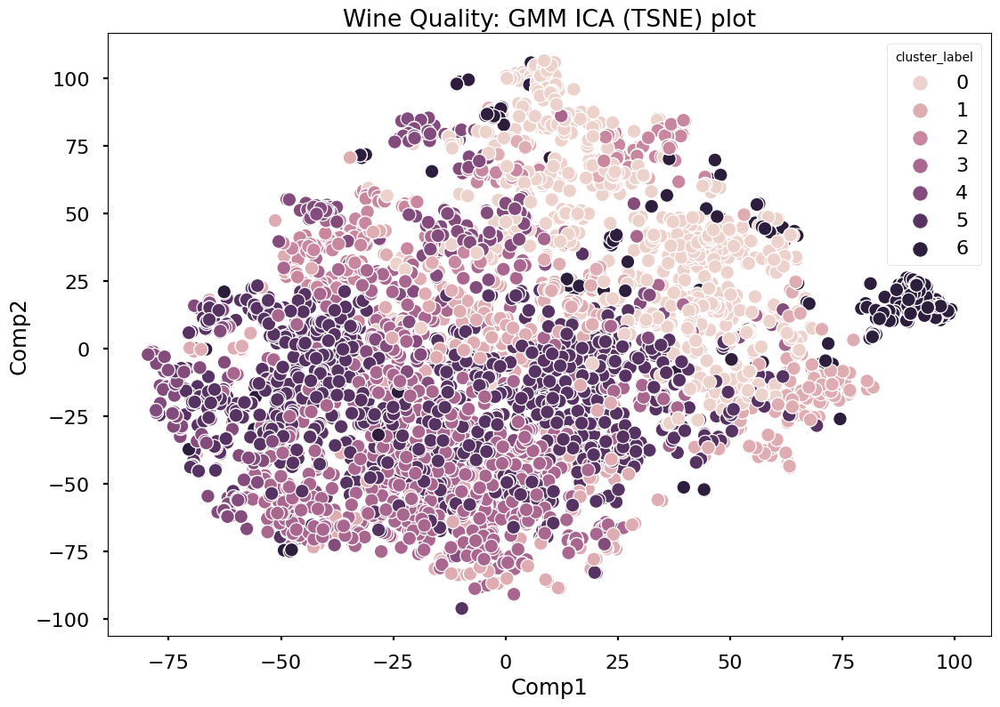

In [164]:
# Reference: https://danielmuellerkomorowska.com/2021/01/05/introduction-to-t-sne-in-python-with-scikit-learn/
from sklearn.manifold import TSNE
tsne_result = TSNE(2).fit_transform(X_ica)
tsne_result_df = pd.DataFrame({'Comp1': tsne_result[:,0], 'Comp2': tsne_result[:,1], 
                               'cluster_label': GaussianMixture(n_components=7, covariance_type='full').fit_predict(X_ica)})
fig, ax = plt.subplots(1)
sns.scatterplot(x='Comp1', y='Comp2', hue='cluster_label', data=tsne_result_df, ax=ax)
plt.title('Wine Quality: GMM ICA (TSNE) plot')
plt.savefig('./plots/WQ_P3_EM_ICA.png')

In [70]:
# Not valid for this data
# color= ['red' if l == 0 else 'blue' if l == 1 else 'yellow' if l == 2 else 'green' for l in GaussianMixture(n_components=4, covariance_type='full', random_state=12).fit_predict(X_ica)]
# plot = plt.scatter(X_ica[:,0], X_ica[:,1], c=color)
# plt.xlabel("IC1")
# plt.ylabel("IC2")
# plt.title("2 independent components")
# plt.show()

# EM on Random Projections transformed data

In [165]:
print("Homogeneity score:",homogeneity_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_RP), y))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_RP), y))
print("Fowlkes Mallows Score:",fowlkes_mallows_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_RP), y))


Homogeneity score: 0.026638225144187868
Adjusted Mutual Information: 0.026798973904615674
Fowlkes Mallows Score: 0.5757162119871051


In [180]:
print("Homogeneity score:",homogeneity_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_RP), GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_RP), GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)))
print("Fowlkes Mallows Score:",fowlkes_mallows_score(GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_RP), GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)))



Homogeneity score: 0.02392780582247455
Adjusted Mutual Information: 0.031483779797876865
Fowlkes Mallows Score: 0.6849054134044392


/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


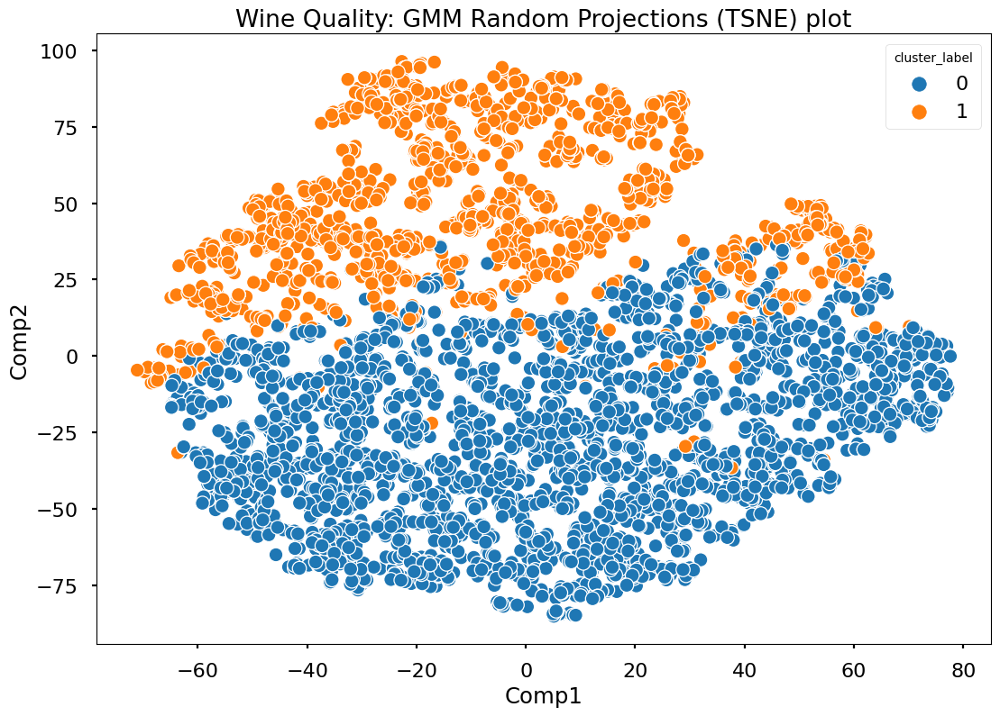

In [167]:
# Reference: https://danielmuellerkomorowska.com/2021/01/05/introduction-to-t-sne-in-python-with-scikit-learn/
from sklearn.manifold import TSNE
tsne_result = TSNE(2).fit_transform(X_RP)
tsne_result_df = pd.DataFrame({'Comp1': tsne_result[:,0], 'Comp2': tsne_result[:,1], 
                               'cluster_label': GaussianMixture(n_components=2, covariance_type='full').fit_predict(X_RP)})
fig, ax = plt.subplots(1)
sns.scatterplot(x='Comp1', y='Comp2', hue='cluster_label', data=tsne_result_df, ax=ax)
plt.title('Wine Quality: GMM Random Projections (TSNE) plot')
plt.savefig('./plots/WQ_P3_EM_RP.png')

# EM on Feature Selection transformed data

In [166]:
print("Homogeneity score:",homogeneity_score(GaussianMixture(n_components=3, covariance_type='full').fit_predict(X_fs), y))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(GaussianMixture(n_components=3, covariance_type='full').fit_predict(X_fs), y))
print("Fowlkes Mallows Score:",fowlkes_mallows_score(GaussianMixture(n_components=3, covariance_type='full').fit_predict(X_fs), y))



Homogeneity score: 0.07390225986735113
Adjusted Mutual Information: 0.0858008971509108
Fowlkes Mallows Score: 0.5435544779571752


In [181]:
print("Homogeneity score:",homogeneity_score(GaussianMixture(n_components=3, covariance_type='full').fit_predict(X_fs), GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)))
print("Adjusted Mutual Information:",adjusted_mutual_info_score(GaussianMixture(n_components=3, covariance_type='full').fit_predict(X_fs), GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)))
print("Fowlkes Mallows Score:",fowlkes_mallows_score(GaussianMixture(n_components=3, covariance_type='full').fit_predict(X_fs), GaussianMixture(n_components=2, covariance_type='full').fit_predict(X)))



Homogeneity score: 0.08017516966494857
Adjusted Mutual Information: 0.09679235461744728
Fowlkes Mallows Score: 0.6341636422670213


/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/anurag/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


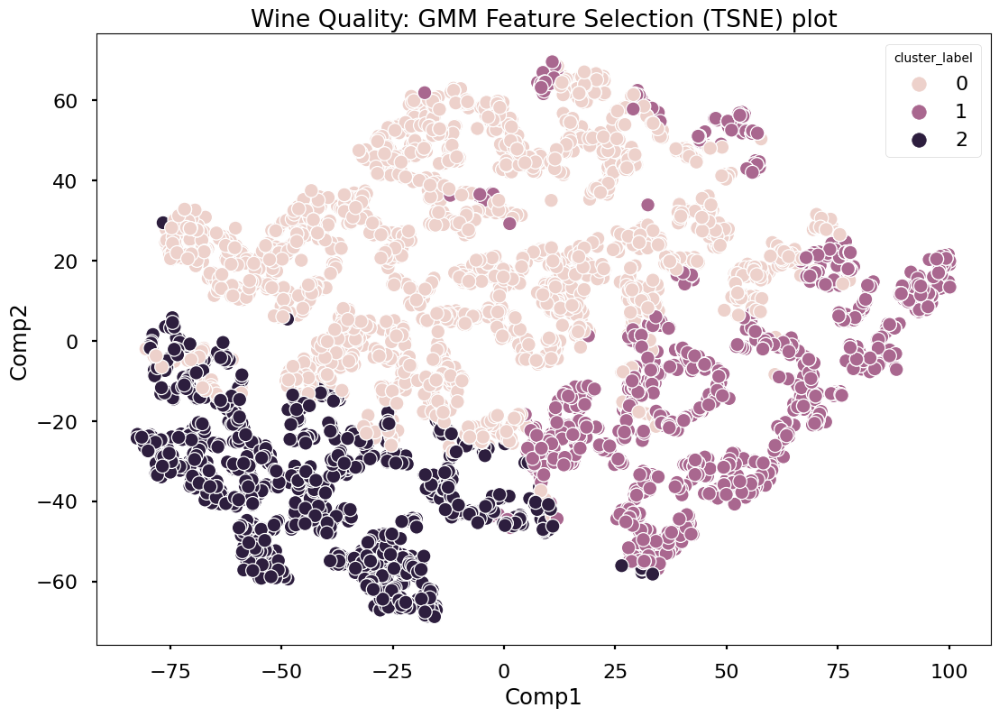

In [168]:
# Reference: https://danielmuellerkomorowska.com/2021/01/05/introduction-to-t-sne-in-python-with-scikit-learn/
from sklearn.manifold import TSNE
tsne_result = TSNE(2).fit_transform(X_fs)
tsne_result_df = pd.DataFrame({'Comp1': tsne_result[:,0], 'Comp2': tsne_result[:,1], 
                               'cluster_label': GaussianMixture(n_components=3, covariance_type='full').fit_predict(X_fs)})
fig, ax = plt.subplots(1)
sns.scatterplot(x='Comp1', y='Comp2', hue='cluster_label', data=tsne_result_df, ax=ax)
plt.title('Wine Quality: GMM Feature Selection (TSNE) plot')
plt.savefig('./plots/WQ_P3_EM_FS.png')